### Table des matières

* [Introduction](#Introduction)
* [Lecture des données](#lecture)
* [Traitement des données textes](#nettoyage)
    * [Bag of words](#bag)
    * [Tf-idf](#tf)
    * [Word embedding : Word2Vec :](#word)
    * [BERT](#ber)
    * [USE](#use)
    * [Approche supervisée : SVM](#sup)
* [Traitement des données images](#image)
    * [SIFT](#sif)
    * [ORB](#orb)
    * [CNN Transfer Learning](#cnn)
    * [Approche supervisée](#super)
* [Combinaison des features textes et images](#comb)
* [Conclusion](#Conclusion)

### Introduction : <a class="anchor" id="Introduction"></a>

Sur la place de marché, des vendeurs proposent des articles à des acheteurs en postant une photo et une description.

Pour l'instant, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs, et est donc peu fiable. De plus, le volume des articles est pour l’instant très petit.

Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible, et dans l'optique d'un passage à l'échelle, il devient nécessaire d'automatiser cette tâche.

Une étude de faisabilité d'un moteur de classification est demandée.

### Lecture des données : <a class="anchor" id="lecture"></a>

In [1]:
# Pour le formatage du code pour respecter la convention PEP8
%load_ext nb_black

<IPython.core.display.Javascript object>

In [3]:
# Appel des fonctions
%run functions.py

<IPython.core.display.Javascript object>

#### Import des librairies : 

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os, sys, time

# Pour les warnings
import warnings

warnings.filterwarnings("ignore")

import logging

logging.disable(logging.WARNING)  # disable WARNING, INFO and DEBUG logging everywhere
# Pour NLP
import nltk
from nltk.tokenize import (
    sent_tokenize,
    word_tokenize,
    wordpunct_tokenize,
)
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim

from wordcloud import WordCloud

# Pour ML
import pickle
import time
from sklearn import cluster, metrics
from sklearn import manifold, decomposition

<IPython.core.display.Javascript object>

#### Import des fichiers : 

In [6]:
path = "/Users/hananemaghlazi/Desktop/Datascientist/Projets_Formation/P6_MAGHLAZI_Hanane/Flipkart/"
filename = os.listdir(path)
filename

['flipkart_com-ecommerce_sample_1050.csv', 'Images']

<IPython.core.display.Javascript object>

In [9]:
df = pd.read_csv(path + filename[0])
df.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",CRNEG7BKMFFYHQ8Z,1899.0000,899.0000,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multicolor""}, {""key""=>""Length"", ""value""=>""213 cm""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 2""}, {""key""=>""Sales Package"", ""value""=>""2 Curtains""}, {""key""=>""Material"", ""value""=>""Polyester""}]}"
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",BTWEGFZHGBXPHZUH,600.0000,449.0000,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel",No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}, {""key""=>""Type"", ""value""=>""Bath Towel""}, {""key""=>""GSM"", ""value""=>""500""}, {""key""=>""Model Name"", ""value""=>""Sathiyas cotton bath towel""}, {""key""=>""

<IPython.core.display.Javascript object>

In [1026]:
description = pd.DataFrame(
    columns=[
        "Dimensions",
        "NB_colonnes",
        "NB_lignes",
        "Total remplissage",
        "Description",
    ],
    index=[
        "df",
    ],
)

description["Dimensions"] = [
    df.shape,
]

description["NB_lignes"] = [
    df.shape[0],
]

description["NB_colonnes"] = [
    df.shape[1],
]

description["Total remplissage"] = [
    df.count().sum(),
]
description["Description"] = [
    "Fichier contenant des produits avec une description et image",
]
description

,Dimensions,NB_colonnes,NB_lignes,Total remplissage,Description
df,"(1050, 15)",15,1050,15409,Fichier contenant des produits avec une description et image


<IPython.core.display.Javascript object>

#### Structure des données

In [1027]:
summary(df)

Data shape: (1050, 15)
___________________________
Data types:
object     12
float64     2
bool        1
Name: types, dtype: int64
___________________________


,types,counts,uniques,nulls
brand,object,712,491,338
crawl_timestamp,object,1050,149,0
description,object,1050,1050,0
discounted_price,float64,1049,425,1
image,object,1050,1050,0
is_FK_Advantage_product,bool,1050,2,0
overall_rating,object,1050,27,0
pid,object,1050,1050,0
product_category_tree,object,1050,642,0
product_name,object,1050,1050,0


<IPython.core.display.Javascript object>

#### Données manquantes : 

In [1028]:
missing_values(df)

,Variable,nan,%nan
13,brand,338,32.1905%
6,retail_price,1,0.0952%
7,discounted_price,1,0.0952%
14,product_specifications,1,0.0952%
0,uniq_id,0,0.0000%
1,crawl_timestamp,0,0.0000%
2,product_url,0,0.0000%
3,product_name,0,0.0000%
4,product_category_tree,0,0.0000%
5,pid,0,0.0000%


<IPython.core.display.Javascript object>

Un dataframe plutot bien rempli

Des données manquantes pour les variable brand, retail_price et discounted_price	

#### Exploration des colonnes: 

In [1018]:
df.product_rating.value_counts()

No rating available    889
5                       43
4                       21
3                       12
1                       10
4.5                     10
4.3                      9
3.7                      8
3.5                      8
2                        6
4.1                      4
4.2                      4
3.8                      3
4.4                      3
4.7                      3
2.3                      3
3.6                      3
4.8                      2
2.5                      1
3.2                      1
2.2                      1
4.9                      1
3.3                      1
3.9                      1
3.1                      1
2.7                      1
1.5                      1
Name: product_rating, dtype: int64

<IPython.core.display.Javascript object>

In [50]:
df.overall_rating.value_counts()

No rating available    889
5                       43
4                       21
3                       12
1                       10
4.5                     10
4.3                      9
3.7                      8
3.5                      8
2                        6
4.1                      4
4.2                      4
3.8                      3
4.4                      3
4.7                      3
2.3                      3
3.6                      3
4.8                      2
2.5                      1
3.2                      1
2.2                      1
4.9                      1
3.3                      1
3.9                      1
3.1                      1
2.7                      1
1.5                      1
Name: overall_rating, dtype: int64

<IPython.core.display.Javascript object>

In [10]:
# colonne redondante: overall_rating--> je la supprime et je supprime les colonnes inutiles
print("Taille avant suppression", df.shape)
list_drop = [
    "crawl_timestamp",
    "product_url",
    "pid",
    "overall_rating",
]
df.drop(list_drop, axis=1, inplace=True)
print("Taille après suppression", df.shape)

Taille avant suppression (1050, 15)
Taille après suppression (1050, 11)


<IPython.core.display.Javascript object>

- Vérification des doublons

In [14]:
for col in df.columns:
    n = df.duplicated(subset=col).sum()
    print("La colonne ", col, ":", "duplicated", n)

La colonne  uniq_id : duplicated 0
La colonne  product_name : duplicated 0
La colonne  product_category_tree : duplicated 408
La colonne  retail_price : duplicated 695
La colonne  discounted_price : duplicated 625
La colonne  image : duplicated 0
La colonne  is_FK_Advantage_product : duplicated 1048
La colonne  description : duplicated 0
La colonne  product_rating : duplicated 1023
La colonne  brand : duplicated 559
La colonne  product_specifications : duplicated 65


<IPython.core.display.Javascript object>

uniq_id est l'identifiant unique du produit

pas de doublons de nom

pid est in identifiant

--> Pas de texte en double pour les colonnes product_name et description

- Vérification des distributions :

In [15]:
df.describe()

,retail_price,discounted_price
count,1049.0000,1049.0000
mean,2186.1973,1584.5272
std,7639.2294,7475.0997
min,35.0000,35.0000
25%,555.0000,340.0000
50%,999.0000,600.0000
75%,1999.0000,1199.0000
max,201000.0000,201000.0000


<IPython.core.display.Javascript object>

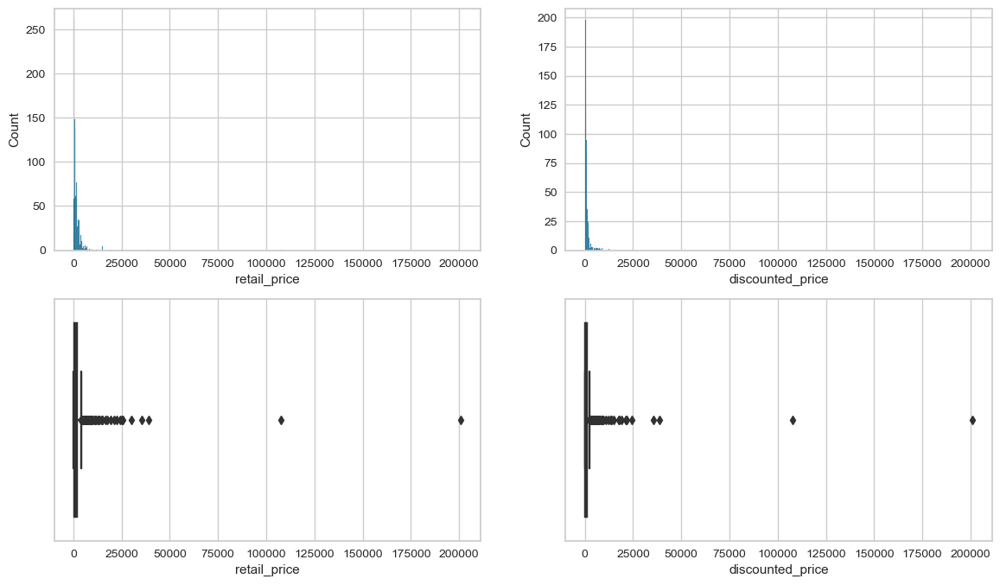

<IPython.core.display.Javascript object>

In [74]:
col = ["retail_price", "discounted_price"]
# Distribution des variables
fig = plt.figure(1, figsize=(14, 8))
for i, label in enumerate(col):
    plt.subplot(2, 2, i + 1)
    sns.histplot(df[label])
    plt.subplot(2, 2, i + 3)
    sns.boxplot(df[label])
plt.show()

Distribution asymétrique et présence d'outliers

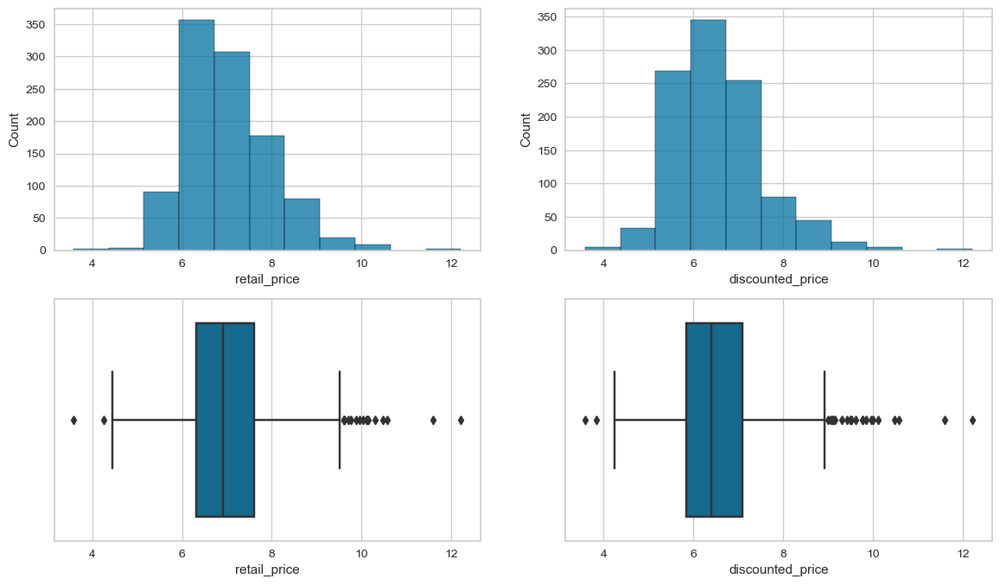

<IPython.core.display.Javascript object>

In [75]:
# Application du log
fig = plt.figure(1, figsize=(14, 8))
for i, label in enumerate(col):
    plt.subplot(2, 2, i + 1)
    sns.histplot(
        df[label].apply(lambda x: np.log(1 + x)),
        bins=int(1 + np.log2(len(df))),
    )
    plt.subplot(2, 2, i + 3)
    sns.boxplot(df[label].apply(lambda x: np.log(1 + x)))
plt.show()

Plus d'outliers sur la partie supérieure

- Vérification des variables catég

In [76]:
missing_values(df)

,Variable,nan,%nan
9,brand,338,32.1905%
3,retail_price,1,0.0952%
4,discounted_price,1,0.0952%
10,product_specifications,1,0.0952%
0,uniq_id,0,0.0000%
1,product_name,0,0.0000%
2,product_category_tree,0,0.0000%
5,image,0,0.0000%
6,is_FK_Advantage_product,0,0.0000%
7,description,0,0.0000%


<IPython.core.display.Javascript object>

- DIstribution et fréquence des colonnes object

In [16]:
df.describe(include=object)

,uniq_id,product_name,product_category_tree,image,description,product_rating,brand,product_specifications
count,1050,1050,1050,1050,1050,1050,712,1049
unique,1050,1050,642,1050,1050,27,490,984
top,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Bed Linen >> Blankets, Quilts & Dohars""]",55b85ea15a1536d46b7190ad6fff8ce7.jpg,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""value""=>""Mug""}, {""key""=>""Mug Capacity"", ""value""=>""5.5 l""}, {""key""=>""Freezer Safe"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Ceramic""}, {""key""=>""Microwave Safe"", ""value""=>""Yes""}, {""value""=>""1 Year Rockmantra Brand Warranty and Free Transit Insurance.""}, {""key""=>""Diameter"", ""value""=>""88 mm""}, {""key""=>""Weight"", ""value""=>""300 g""}, {""key""=>""Height"", ""value""=>""101 mm""}, {""key""=>""Width"", ""value""=>""88 mm""}, {""key""=>""Sales Package"", ""value""=>""1 mug""}]}"
freq,1,1,56,1,1,889,11,22


<IPython.core.display.Javascript object>

No rating available est référencé 889 fois dans le dataframe, brand(PRINT SHAPES) 11 fois, cette  product_specifications 22 fois

Je vérifie les lignes avec No rating available

In [17]:
df[df["product_rating"] == "No rating available"]

,uniq_id,product_name,product_category_tree,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",1899.0000,899.0000,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multicolor""}, {""key""=>""Length"", ""value""=>""213 cm""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 2""}, {""key""=>""Sales Package"", ""value""=>""2 Curtains""}, {""key""=>""Material"", ""value""=>""Polyester""}]}"
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",600.0000,449.0000,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel",No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}, {""key""=>""Type"", ""value""=>""Bath Towel""}, {""key""=>""GSM"", ""value""=>""500""}, {""key""=>""Model Name"", ""value""=>""Sathiyas cotton bath towel""}, {""key""=>""Ideal For"", ""value""=>""Men, Women, Boys, Girls""}, {""key""=>""Model ID"", ""value""=>""asvtwl322""}, {""key""=>""Color"", ""value""=>""Red, Yellow, Blue""}, {""key""=>""Size"", ""value""=>""Mediam""}, {""key""=>""Length"", ""value""=>""30 inch""}, {""key""=>""Width"", ""value""=>""60 inch""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""3""}, {""key""=>""Sales P

<IPython.core.display.Javascript object>

pas de spécifications particulière

#### Exploration des données : 

- La variable is_FK_Advantage_product

In [18]:
df.is_FK_Advantage_product.value_counts()

False    993
True      57
Name: is_FK_Advantage_product, dtype: int64

<IPython.core.display.Javascript object>

In [19]:
df.is_FK_Advantage_product.value_counts(normalize=True)

False   0.9457
True    0.0543
Name: is_FK_Advantage_product, dtype: float64

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='is_FK_Advantage_product', ylabel='count'>

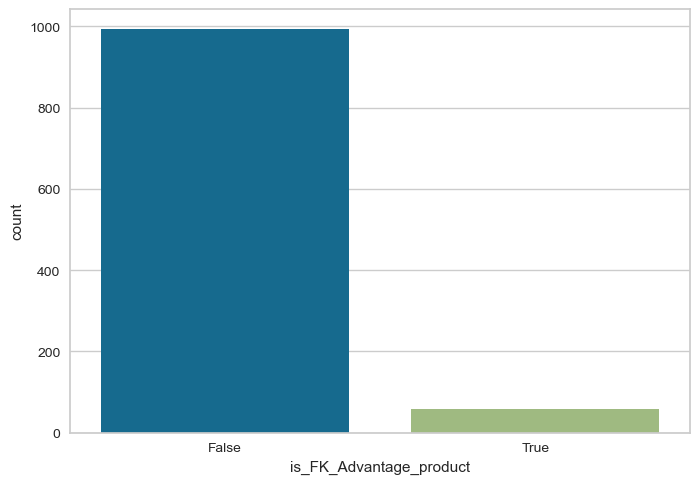

<IPython.core.display.Javascript object>

In [20]:
sns.countplot(x="is_FK_Advantage_product", data=df)

#### Exploration des données texte : 

- La variable description et product_name :

In [92]:
# Longueur de la variable product_name
df.product_name.apply(lambda i: len(i))

0       58
1       26
2       35
3       63
4       53
        ..
1045    46
1046    38
1047    65
1048    39
1049    28
Name: product_name, Length: 1050, dtype: int64

<IPython.core.display.Javascript object>

In [99]:
# Longueur de la variable description
df.description.apply(lambda i: len(i))

0       1420
1        444
2       1258
3        858
4       1197
        ... 
1045    2432
1046    1660
1047     262
1048     210
1049     187
Name: description, Length: 1050, dtype: int64

<IPython.core.display.Javascript object>

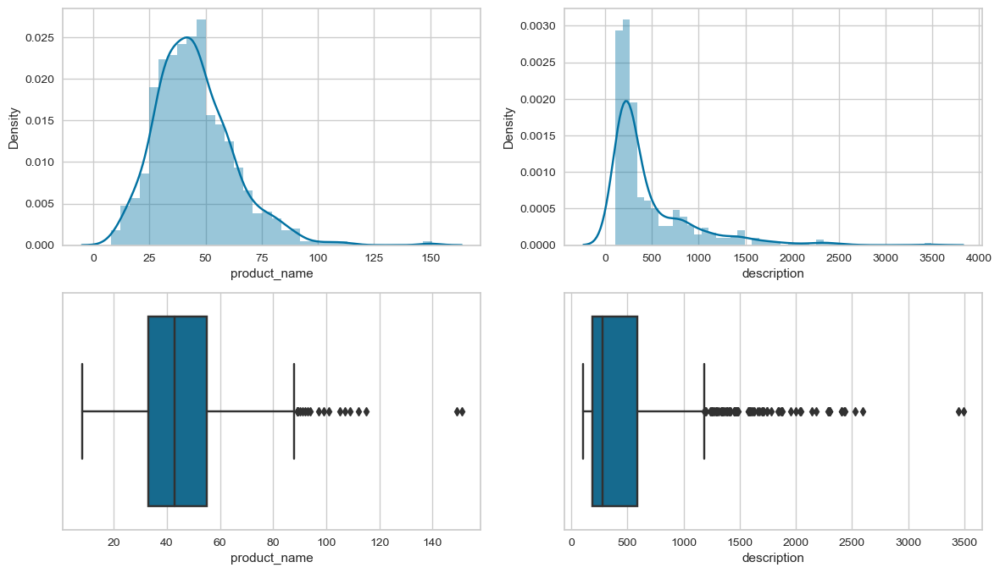

<IPython.core.display.Javascript object>

In [1032]:
# Distribution des longueurs( des vecteurs numériques)
col=["product_name","description"]
fig = plt.figure(1, figsize=(14, 8))
for i, label in enumerate(col):
    plt.subplot(2, 2, i + 1)
    tmp = df[label].str.len()
    sns.distplot(tmp)
    plt.subplot(2, 2, i + 3)
    sns.boxplot(tmp)
plt.show()

pour product_name une description normale
pour la description une distribution asymétrique : y a des produits avec une petite description et d'autres avec grande, la plupart des texte ont une grande description


In [1064]:
# Ajouter colonnes de longueurs : nbr caractères
tmp1 = df.product_name.str.len()
tmp = df.description.str.len()
df["_len_product_name"] = tmp1
df["_len_description"] = tmp
df.head()

,uniq_id,product_name,product_category_tree,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,brand,product_specifications,_len_product_name,_len_description
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",1899.0000,899.0000,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multicolor""}, {""key""=>""Length"", ""value""=>""213 cm""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 2""}, {""key""=>""Sales Package"", ""value""=>""2 Curtains""}, {""key""=>""Material"", ""value""=>""Polyester""}]}",58,1420
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",600.0000,449.0000,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel",No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}, {""key""=>""Type"", ""value""=>""Bath Towel""}, {""key""=>""GSM"", ""value""=>""500""}, {""key""=>""Model Name"", ""value""=>""Sathiyas cotton bath towel""}, {""key""=>""Ideal For"", ""value""=>""Men, Women, Boys, Girls""}, {""key""=>""Model ID"", ""value""=>""asvtwl322""}, {""key""=>""Color"", ""value""=>""Red, Yellow, Blue""}, {""key""=>""Size"", ""value""=>""Mediam""}, {""key""=>""Length"", ""value""=>""30 inch""}, {""key""=>""Width"", ""value""=>""60 inch""}, {""key""=>""Number of Contents in Sales Packag

<IPython.core.display.Javascript object>

In [1036]:
df._len_description.max()

3490

<IPython.core.display.Javascript object>

In [1037]:
df._len_product_name.max()

151

<IPython.core.display.Javascript object>

In [1046]:
df.describe()

,retail_price,discounted_price,_len_product_name,_len_description
count,1049.0000,1049.0000,1050.0000,1050.0000
mean,2186.1973,1584.5272,45.1019,473.8210
std,7639.2294,7475.0997,17.4973,457.9104
min,35.0000,35.0000,8.0000,109.0000
25%,555.0000,340.0000,33.0000,192.0000
50%,999.0000,600.0000,43.0000,278.0000
75%,1999.0000,1199.0000,55.0000,588.2500
max,201000.0000,201000.0000,151.0000,3490.0000


<IPython.core.display.Javascript object>

- Matrice de corrélation

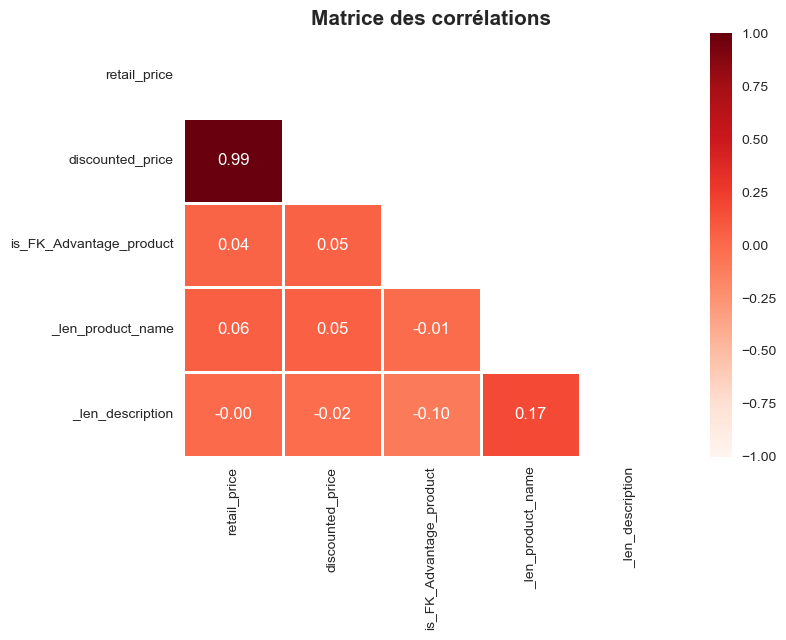

<IPython.core.display.Javascript object>

In [1034]:
correlation_matrix(df)

In [24]:
df.describe()

,retail_price,discounted_price,_len_product_name,_len_description
count,1049.0000,1049.0000,1050.0000,1050.0000
mean,2186.1973,1584.5272,45.1019,473.8210
std,7639.2294,7475.0997,17.4973,457.9104
min,35.0000,35.0000,8.0000,109.0000
25%,555.0000,340.0000,33.0000,192.0000
50%,999.0000,600.0000,43.0000,278.0000
75%,1999.0000,1199.0000,55.0000,588.2500
max,201000.0000,201000.0000,151.0000,3490.0000


<IPython.core.display.Javascript object>

- Variable : product_category_tree	

- Présence de >>

"Computers >> Network Components >> Routers >> Tenda Routers"]
"Baby Care >> Diapering & Potty Training >> Nappies & Cloth Diapers >> MyKid Nappies & Cloth Diapers"
Home Decor & Festive Needs >> Showpieces >> Ethnic >> Lal Haveli Ethnic"

La variable « product_category_tree » représente l’arborescence complète d’un article.

- Je découpe pour en extraire la première partie

In [12]:
def split_str_columns_df(df, str_columns):
    """Function that splits the str columns " " is the separation, create newcolumn and remove the original."""
    # new data frame with split value columns
    # df=dataframe
    for i in range(len(str_columns)):
        col = str_columns[i]
        new_col1 = col + "_a"

        # Split

        new = df[col].str.split(">>", n=1, expand=True)

        # making seperate first name column from new data frame
        df[new_col1] = new[0]

        # Dropping old Name columns
        df.drop(columns=[col], inplace=True)

    return df

<IPython.core.display.Javascript object>

In [1065]:
# Appliquer la fonction sur la colonne
str_columns = ["product_category_tree"]

split_str_columns_df(df, str_columns)
df.rename(columns={"product_category_tree_a": "categorie"}, inplace=True)
df.head()

,uniq_id,product_name,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,brand,product_specifications,_len_product_name,_len_description,categorie
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,1899.0000,899.0000,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multicolor""}, {""key""=>""Length"", ""value""=>""213 cm""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 2""}, {""key""=>""Sales Package"", ""value""=>""2 Curtains""}, {""key""=>""Material"", ""value""=>""Polyester""}]}",58,1420,"[""Home Furnishing"
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,600.0000,449.0000,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel",No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}, {""key""=>""Type"", ""value""=>""Bath Towel""}, {""key""=>""GSM"", ""value""=>""500""}, {""key""=>""Model Name"", ""value""=>""Sathiyas cotton bath towel""}, {""key""=>""Ideal For"", ""value""=>""Men, Women, Boys, Girls""}, {""key""=>""Model ID"", ""value""=>""asvtwl322""}, {""key""=>""Color"", ""value""=>""Red, Yellow, Blue""}, {""key""=>""Size"", ""value""=>""Mediam""}, {""key""=>""Length"", ""value""=>""30 inch""}, {""key""=>""Width"", ""value""=>""60 inch""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""3""}, {""key""=>""Sales Package"", ""value""=>""3 Bath Towel""}]}",26,444,"[""Baby Care"
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,"Key Features of Euro

<IPython.core.display.Javascript object>

In [1066]:
df["categorie"] = df["categorie"].str.extract("([a-zA-Z ]+)", expand=False).str.strip()
df.categorie.value_counts()

Home Furnishing             150
Baby Care                   150
Watches                     150
Home Decor                  150
Kitchen                     150
Beauty and Personal Care    150
Computers                   150
Name: categorie, dtype: int64

<IPython.core.display.Javascript object>

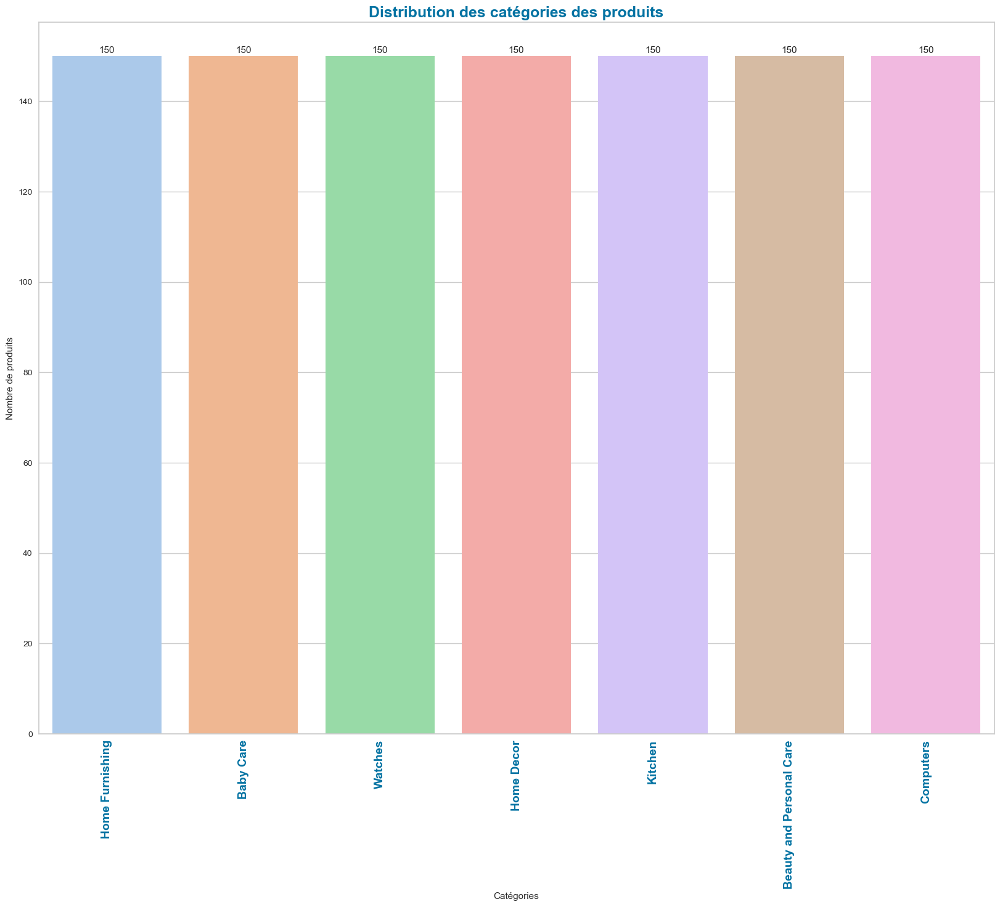

<IPython.core.display.Javascript object>

In [28]:
countplt, ax = plt.subplots(figsize=(20, 15))
ax = sns.countplot(
    x="categorie",
    data=df,
    ax=ax,
    palette="pastel",
    order=df["categorie"].value_counts().index,
)

plt.title(
    "Distribution des catégories des produits",
    fontsize=18,
    color="b",
    fontweight="bold",
)
plt.xlabel("Catégories")
plt.ylabel("Nombre de produits")
plt.xticks(rotation=90, fontsize=14, color="b", fontweight="bold")
for rect in ax.patches:
    ax.text(
        rect.get_x() + rect.get_width() / 2,
        rect.get_height() + 0.75,
        rect.get_height(),
        horizontalalignment="center",
        fontsize=11,
    )
    countplt

Nous disposons de 150 produits dans chaque catégorie de produit

#### Exploration corpus et documents

In [1067]:
# colonne à retirer
print("Taille avant suppression", df.shape)
list_drop = ["_len_product_name", "_len_description"]
df.drop(list_drop, axis=1, inplace=True)
print("Taille après suppression", df.shape)

Taille avant suppression (1050, 13)
Taille après suppression (1050, 11)


<IPython.core.display.Javascript object>

Print n random documents

In [1055]:
df_samp = df.sample(20)
df_samp.head()

,uniq_id,product_name,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,brand,product_specifications,categorie
925,5307e0db12b1018746ac3801d189c379,Home Delight 130 inch Pink Rice Lights,300.0000,199.0000,5307e0db12b1018746ac3801d189c379.jpg,False,"Home Delight 130 inch Pink Rice Lights (Pack of 5)\r\n Price: Rs. 199\r\n\t\t\t\t\r\n\t\t\tThese are Pink Rice light. Colourful PVC copper wire Warmer, with traditional glow. Flame-tip shape Cuts electricity costs up to 80% than ordinary bulbs. Bulbs which are also virtually unbreakable and very durable. These light series can be hanged indoors or outdoor. IP44 High energy saving and safety Superior material with competitive price Promotion for festivals.\r\nThese are Pink Rice light. Colourful PVC copper wire Warmer, with traditional glow. Flame-tip shape Cuts electricity costs up to 80% than ordinary bulbs. Bulbs which are also virtually unbreakable and very durable. These light series can be hanged indoors or outdoor. IP44 High energy saving and safety Superior material with competitive price Promotion for festivals.",No rating available,Home Delight,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Home Delight""}, {""key""=>""Multi-Functions"", ""value""=>""Still Lights, Single Colour""}, {""key""=>""Model Number"", ""value""=>""RLP0405""}, {""key""=>""Bulb Type"", ""value""=>""Gel""}, {""key""=>""Length"", ""value""=>""130 inch""}, {""key""=>""Plug Type"", ""value""=>""Fused""}, {""key""=>""Wire Color"", ""value""=>""Pink""}, {""key""=>""Color"", ""value""=>""Pink""}, {""key""=>""Number of Bulbs"", ""value""=>""30""}, {""key""=>""Warranty Summary"", ""value""=>""No Warranty""}, {""key""=>""Sales Package"", ""value""=>""5 Rice Light""}, {""key""=>""Pack of"", ""value""=>""5""}]}","[""Home Decor & Festive Needs"
835,c5720509a67da707afcb6f4f0282d529,Amaze Fashion Universal Portable Lamp PL014AMAZWH USB Led Light,199.0000,88.0000,c5720509a67da707afcb6f4f0282d529.jpg,False,Buy Amaze Fashion Universal Portable Lamp PL014AMAZWH USB Led Light for Rs.88 online. Amaze Fashion Universal Portable Lamp PL014AMAZWH USB Led Light at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee.,No rating available,Amaze Fashion,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Amaze Fashion""}, {""key""=>""Type"", ""value""=>""Led Light""}, {""key""=>""Model Name"", ""value""=>""Universal Portable Lamp""}, {""key""=>""Material"", ""value""=>""Plastic""}, {""key""=>""System Requirements"", ""value""=>""USB Port v2.0""}, {""key""=>""Model ID"", ""value""=>""PL014AMAZWH""}, {""key""=>""Color"", ""value""=>""White""}, {""key""=>""Sales Package"", ""value""=>""1 USB""}]}","[""Computers"
572,2cbad7ead8eb8dd92823b9f525c87b9c,Times 327TMS327 Party-Wedding Analog Watch - For Women,599.0000,599.0000,2cbad7ead8eb8dd92823b9f525c87b9c.jpg,False,"Times 327TMS327 Party-Wedding Analog Watch - For Women - Buy Times 327TMS327 Party-Wedding Analog Watch - For Women 327TMS327 Online at Rs.599 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!",No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograph"", ""value""=>""No""}, {""key""=>""Altimeter"", ""value""=>""No""}, {""key""=>""Date Display"", ""value""=>""No""}, {""key""=>""Barometer"", ""value""=>""No""}, {""key""=>""Alarm Clock"", ""value""=>""No""}, {""key""=>""Compass"", ""value""=>""No""}, {""key""=>""Calendar"", ""value""=>""No""}, {""key""=>""Luminous"", ""value""=>""No""}, {""key""=>""Weight"", ""value""=>""250 g""}, {""key""=>""Mechanism"", ""value""=>""Quartz""}, {""key""=>""Type"", ""value""=>""Analog""}, {""key""=>""Series"", ""value""=>""Party-Wedding""}, {""key""=>""Style Code"", ""value""=>""327TMS327""}, {""key""=>""Occasion"", ""value""=>""Party-Wedding""}, {""key""=>""Ideal For"", ""value""=>""Women""}, {""key""=>""Novelty Feature"", 

<IPython.core.display.Javascript object>

In [20]:
# 20 nom de produits pour chaque catégorie
for idx, ser in df_samp.iterrows():
    txt_1 = f"categorie: {ser['categorie']} \n"
    print(txt_1 + ser["product_name"] + "..." + "\n\n")

categorie: Kitchen 
Prithish Friend Indeed Ceramic Mug...


categorie: Computers 
Airtel B310s-927...


categorie: Home Decor 
Tatvaarts Tribal Face Showpiece  -  21.59 cm...


categorie: Home Furnishing 
Rajasthan Crafts Abstract Single Quilts & Comforters Pink...


categorie: Home Decor 
Tatvaarts Elephant Mini ( Fine-Finish) Showpiece  -  8.89 cm...


categorie: Watches 
Perucci PC-218 Decker Analog Watch  - For Men...


categorie: Home Decor 
Home Delight 130 inch Pink Rice Lights...


categorie: Baby Care 
Ireeya Abstract Single Coral Blanket Blue...


categorie: Watches 
Fluid FU203-GR01 Analog-Digital Watch  - For Men...


categorie: Watches 
Adino ADF04 Analog Watch  - For Girls...


categorie: Computers 
Clublaptop Lenovo L08O6C02 6 Cell Laptop Battery...


categorie: Computers 
Techone+ Portable Power Bank, and Laptops_2 set USB Led Light...


categorie: Beauty and Personal Care 
Mxofere Combo Lavender Rose Jasmine Papaya Aloevera Soap Kit...


categorie: Computers 
LUV LUV M

<IPython.core.display.Javascript object>

In [21]:
# 20 descriptions pour chaque catégorie
for idx, ser in df_samp.iterrows():
    txt_1 = f"categorie: {ser['categorie']} \n"
    print(txt_1 + ser["description"] + "..." + "\n\n")

categorie: Kitchen 
Buy Prithish Friend Indeed Ceramic Mug for Rs.225 online. Prithish Friend Indeed Ceramic Mug at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee....


categorie: Computers 
Buy Airtel B310s-927 only for Rs. 2700 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!...


categorie: Home Decor 
Tatvaarts Tribal Face Showpiece  -  21.59 cm (Brass, Gold)
                         Price: Rs. 6,100
				
			A nice and beautiful home décor item. Made of cast iron, this product stands out to enjoy a special place in your room. It can also be gifted to your near and dear ones on any eventful day.
A nice and beautiful home décor item. Made of cast iron, this product stands out to enjoy a special place in your room. It can also be gifted to your near and dear ones on any eventful day....


categorie: Home Furnishing 
Buy Rajasthan Crafts Abstract Single Quilts & Comforters Pi

<IPython.core.display.Javascript object>

#### Afficher documents par catégorie

In [16]:
# print out n_samp documents from a corpus
def print_sample(sub_df, n_sample=20):

    samp = sub_df.sample(n_sample)
    for idx, ser in samp.iterrows():
        txt_1 = f"categorie:{ser['categorie']}\n"
        print(txt_1 + ser["description"] + "..." + "\n\n")

<IPython.core.display.Javascript object>

In [17]:
# Filtre pour la catégorie watches
df_1 = df[df.categorie == "Watches"]
df_1.head()

,uniq_id,product_name,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,brand,product_specifications,categorie
5,893aa5ed55f7cff2eccea7758d7a86bd,Maserati Time R8851116001 Analog Watch - For Boys,24400.0000,24400.0000,893aa5ed55f7cff2eccea7758d7a86bd.jpg,False,"Maserati Time R8851116001 Analog Watch - For Boys - Buy Maserati Time R8851116001 Analog Watch - For Boys R8851116001 Online at Rs.24400 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!",No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograph"", ""value""=>""Yes""}, {""key""=>""Date Display"", ""value""=>""Yes, Day and Date Display""}, {""key""=>""Altimeter"", ""value""=>""No""}, {""key""=>""Barometer"", ""value""=>""No""}, {""key""=>""Alarm Clock"", ""value""=>""NO""}, {""key""=>""Compass"", ""value""=>""NO""}, {""key""=>""Calendar"", ""value""=>""No""}, {""key""=>""Luminous"", ""value""=>""No""}, {""key""=>""Type"", ""value""=>""Analog""}, {""key""=>""Style Code"", ""value""=>""R8851116001""}, {""key""=>""Ideal For"", ""value""=>""Boys""}, {""key""=>""Occasion"", ""value""=>""Party-Wedding""}, {""value""=>""1 Year Brand Warranty""}, {""key""=>""Dial Shape"", ""value""=>""Oval""}, {""key""=>""Strap Color"", ""value""=>""Green""}, {""key""=>""Scratch Resistant"", ""value""=>""No""}, {""key""=>""Water Resistant"", ""value""=>""Yes""}, {""key""=>""Dial Color"", ""value""=>""Grey""}]}",Watches
6,f355cc1ccb08bd0d283ed979b7ee7515,"Camerii WM64 Elegance Analog Watch - For Men, Boys",1099.0000,449.0000,f355cc1ccb08bd0d283ed979b7ee7515.jpg,False,"Camerii WM64 Elegance Analog Watch - For Men, Boys - Buy Camerii WM64 Elegance Analog Watch - For Men, Boys WM64 Online at Rs.449 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!",5,NaN,"{""product_specification""=>[{""key""=>""Chronograph"", ""value""=>""No""}, {""key""=>""Date Display"", ""value""=>""No""}, {""key""=>""Altimeter"", ""value""=>""No""}, {""key""=>""Barometer"", ""value""=>""No""}, {""key""=>""Alarm Clock"", ""value""=>""No""}, {""key""=>""Compass"", ""value""=>""No""}, {""key""=>""Calendar"", ""value""=>""No""}, {""key""=>""Luminous"", ""value""=>""No""}, {""key""=>""Mechanism"", ""value""=>""Quartz""}, {""key""=>""Type"", ""value""=>""Analog""}, {""key""=>""Series"", ""value""=>""Elegance""}, {""key""=>""Style Code"", ""value""=>""WM64""}, {""key""=>""Ideal For"", ""value""=>""Men, Boys""}, {""key""=>""Occasion"", ""value""=>""Formal""}, {""key""=>""Power Source"", ""value""=>""Battery Powered""}, {""key""=>""Novelty Feature"", ""value""=>""Very Stylish Design With The Reasonable Price""}, {""key""=>""Diameter"", ""value""=>""40 mm""}, {""key""=>""Width"", ""value""=>""40 mm""}, {""key""=>""Thickness"", ""value""=>""8 mm""}, {""value""=>""6 Months Warranty Against Manufacturing Defects.""}, {""value""=>""Watch, Box, Camerii Card""}, {""key""=>""Strap Type"", ""value""=>""Metal""}, {""key""=>""Dial Shape"", ""value""=>""Round""}, {""key""=>""Box Material"", ""value""=>""Metal""}, {""key""=>""Strap Color"", ""value""=>""Mettalic""}, {""key""=>""Shock Resistance"", ""value""=>""Yes""}, {""key""=>""Case / Bezel Material"", ""value""=>""High Quality Alloy Case""}, {""key""=>""Scratch Resistant"", ""value""=>""No""}, {""key""=>""Water Resistant"", ""value""=>""Yes""}, {""key""=>""Clasp Type"", ""value""=>""Buckle""}, {""key""=>""Dial Color"", ""value""=>""Black""}, {""key""=>""Strap Material"", ""value""=>""Stainless Steel Strap""}]}",Watches
7,dd0e3470a7e6ed76fd69c2da27721041,T STAR UFT-TSW-005-BK-BR Analog Watch - For Boys,999.0000,399.0000,dd0e3470a7e6ed76fd69c2da27721041.jpg,False,"T STAR UFT-TSW-005-BK-BR Analog Watch - For Boys\r\n Price: Rs. 399\r\n\t\t\t\t\r\n\t\t\tWhether you are on your way to work or travelling abroad with family, lifestyle accessories like watches, wallets and belts 

<IPython.core.display.Javascript object>

In [36]:
# print 20 docs de la catégorie watches
print_sample(df_1)

categorie:Watches
CB Fashion 108-121 Analog Watch  - For Women - Buy CB Fashion 108-121 Analog Watch  - For Women  108-121 Online at Rs.619 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!...


categorie:Watches
Perucci PC-301 Analog Watch  - For Men - Buy Perucci PC-301 Analog Watch  - For Men  PC-301 Online at Rs.1395 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!...


categorie:Watches
Sonata 7085YL01 Analog Watch  - For Men - Buy Sonata 7085YL01 Analog Watch  - For Men  7085YL01 Online at Rs.750 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!...


categorie:Watches
Maxima 19431CMGY Gold Analog Watch  - For Men - Buy Maxima 19431CMGY Gold Analog Watch  - For Men  19431CMGY Online at Rs.795 in India Only at Flipkart.com. Gol

<IPython.core.display.Javascript object>

#### Visualisation avec word cloud 

In [1068]:
df.categorie.value_counts()

Home Furnishing             150
Baby Care                   150
Watches                     150
Home Decor                  150
Kitchen                     150
Beauty and Personal Care    150
Computers                   150
Name: categorie, dtype: int64

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Baby Care')

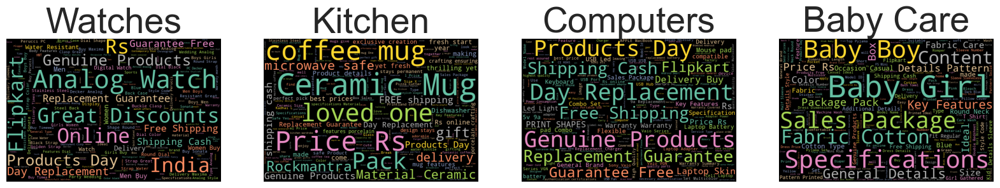

<IPython.core.display.Javascript object>

In [1079]:
fig, (ax1, ax2, ax3,ax4) = plt.subplots(1, 4, figsize=[20, 5])

wordcloud1 = WordCloud(
    random_state=1, background_color="black", colormap="Set2", width=600, height=400
).generate(" ".join(df[df.categorie == "Watches"]["description"]))
ax1.imshow(wordcloud1)
ax1.axis("off")
ax1.set_title("Watches", fontsize=40)

wordcloud2 = WordCloud(
    random_state=1, background_color="black", colormap="Set2", width=600, height=400
).generate(" ".join(df[df.categorie == "Kitchen"]["description"]))
ax2.imshow(wordcloud2)
ax2.axis("off")
ax2.set_title("Kitchen", fontsize=40)

wordcloud3 = WordCloud(
    random_state=1, background_color="black", colormap="Set2", width=600, height=400
).generate(" ".join(df[df.categorie == "Computers"]["description"]))
ax3.imshow(wordcloud3)
ax3.axis("off")
ax3.set_title("Computers", fontsize=40)

wordcloud4 = WordCloud(
    random_state=1, background_color="black", colormap="Set2", width=600, height=400
).generate(" ".join(df[df.categorie == "Baby Care"]["description"]))
ax4.imshow(wordcloud4)
ax4.axis("off")
ax4.set_title("Baby Care", fontsize=40)



- Nettoyage des données : 

Sélctionner un document spécifique : 

- on travaille sur un corpus de description et chaque ligne de la colonne description est une description assimilable à  un document
nous avons un ensemble de document qui constitue un corpus

In [18]:
# selectionner un document
doc = df.description.sample(1)
doc = doc.values[0]
doc

'Key Features of KLOCX Analog Wall Clock Black Round Width: 29.85 cm Height: 1 cm,Specifications of KLOCX Analog Wall Clock (Black, With Glass) General Model Number KLOCX-89 Dimensions Other Dimensions 33.1 x 32.6 x 4.4 cm Height 1 cm Width 29.85 cm Body Features Dial Shape Round'

<IPython.core.display.Javascript object>

- Lower : minuscule

In [19]:
doc = doc.lower()
doc

'key features of klocx analog wall clock black round width: 29.85 cm height: 1 cm,specifications of klocx analog wall clock (black, with glass) general model number klocx-89 dimensions other dimensions 33.1 x 32.6 x 4.4 cm height 1 cm width 29.85 cm body features dial shape round'

<IPython.core.display.Javascript object>

- Tokenization : réduire en un ensemble de brique élémentaire

In [20]:
tokens = word_tokenize(doc)
tokens

['key',
 'features',
 'of',
 'klocx',
 'analog',
 'wall',
 'clock',
 'black',
 'round',
 'width',
 ':',
 '29.85',
 'cm',
 'height',
 ':',
 '1',
 'cm',
 ',',
 'specifications',
 'of',
 'klocx',
 'analog',
 'wall',
 'clock',
 '(',
 'black',
 ',',
 'with',
 'glass',
 ')',
 'general',
 'model',
 'number',
 'klocx-89',
 'dimensions',
 'other',
 'dimensions',
 '33.1',
 'x',
 '32.6',
 'x',
 '4.4',
 'cm',
 'height',
 '1',
 'cm',
 'width',
 '29.85',
 'cm',
 'body',
 'features',
 'dial',
 'shape',
 'round']

<IPython.core.display.Javascript object>

In [84]:
# longueur liste token
len(tokens)

92

<IPython.core.display.Javascript object>

In [85]:
# nbr token unique
len(set(tokens))

41

<IPython.core.display.Javascript object>

In [21]:
def display_tokens_info(tokens):
    """affiche informations du corpus"""
    print("nb tokens : ", len(tokens), "nb tokens unique", len(set(tokens)))
    print(tokens[:30])

<IPython.core.display.Javascript object>

In [22]:
# test sur un autre tokenizer
tokens = wordpunct_tokenize(doc)
display_tokens_info(tokens)

nb tokens :  66 nb tokens unique 38
['key', 'features', 'of', 'klocx', 'analog', 'wall', 'clock', 'black', 'round', 'width', ':', '29', '.', '85', 'cm', 'height', ':', '1', 'cm', ',', 'specifications', 'of', 'klocx', 'analog', 'wall', 'clock', '(', 'black', ',', 'with']


<IPython.core.display.Javascript object>

meme resultat

- Stopwords : 

In [994]:
# Stop words
stop_w = list(set(stopwords.words("english"))) + [
    "[",
    "]",
    ",",
    ".",
    ":",
    "?",
    "(",
    ")",
]


<IPython.core.display.Javascript object>

In [25]:
tokens = [w for w in tokens if w not in stop_w]
display_tokens_info(tokens)

nb tokens :  51 nb tokens unique 30
['key', 'features', 'klocx', 'analog', 'wall', 'clock', 'black', 'round', 'width', '29', '85', 'cm', 'height', '1', 'cm', 'specifications', 'klocx', 'analog', 'wall', 'clock', 'black', 'glass', 'general', 'model', 'number', 'klocx', '-', '89', 'dimensions', 'dimensions']


<IPython.core.display.Javascript object>

In [26]:
# On remet tout dans une fonction : minuscule,espace,tokenization
def process_text_1(doc, rejoin=False):
    # lower et espace
    doc = doc.lower().strip()
    # tokenize
    tokenizer = RegexpTokenizer(r"\w+")
    raw_tokens_list = tokenizer.tokenize(doc)
    # stop word
    cleaned_tokens_list = [w for w in raw_tokens_list if w not in stop_w]

    if rejoin:
        return "".join(cleaned_tokens_list)
    return cleaned_tokens_list

<IPython.core.display.Javascript object>

In [27]:
tokens = process_text_1(doc)
display_tokens_info(tokens)

nb tokens :  50 nb tokens unique 29
['key', 'features', 'klocx', 'analog', 'wall', 'clock', 'black', 'round', 'width', '29', '85', 'cm', 'height', '1', 'cm', 'specifications', 'klocx', 'analog', 'wall', 'clock', 'black', 'glass', 'general', 'model', 'number', 'klocx', '89', 'dimensions', 'dimensions', '33']


<IPython.core.display.Javascript object>

- Travailler sur tout le corpus: 

In [28]:
# Join all corpus
raw_coprus = "".join(df.description.values)
raw_coprus[:1_000]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

<IPython.core.display.Javascript object>

In [40]:
# longueur du texte de la descption
len(raw_coprus)

497512

<IPython.core.display.Javascript object>

Ce texte contient 497512 caractères

In [29]:
corpus = process_text_1(raw_coprus)
display_tokens_info(corpus)

nb tokens :  61452 nb tokens unique 6165
['key', 'features', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', '213', 'cm', 'height', 'pack', '2', 'price', 'rs', '899', 'curtain', 'enhances', 'look', 'interiors']


<IPython.core.display.Javascript object>

In [130]:
# nombre de fois d'apparition des tokens dans le corpus
tmp = pd.Series(corpus).value_counts()
# les tokens les plus présents
tmp.head(30)

rs                911
products          631
free              618
delivery          567
cash              564
genuine           564
shipping          564
replacement       559
buy               543
day               540
cm                532
1                 524
30                498
flipkart          475
guarantee         471
com               468
online            396
features          395
price             352
watch             329
color             328
baby              320
mug               318
pack              317
material          312
set               306
type              304
cotton            299
specifications    295
box               291
dtype: int64

<IPython.core.display.Javascript object>

In [132]:
# distributions de la présence des tokens
tmp.describe()

count   6165.0000
mean       9.9679
std       38.8973
min        1.0000
25%        1.0000
50%        2.0000
75%        5.0000
max      911.0000
dtype: float64

<IPython.core.display.Javascript object>

asymétrique
50% des tokens sont présents 2 fois

75%  des tokens sont présents 5 fois

<AxesSubplot:>

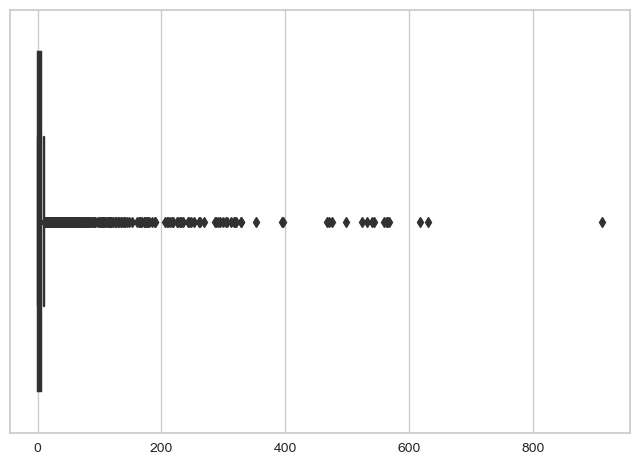

<IPython.core.display.Javascript object>

In [133]:
sns.boxplot(tmp)

- Liste des tokens rare : 

Les tokens qui apparaissent 1 fois ne sont pas interessants

In [31]:
# tmp contient déjà les valeurs uniques, on filtre sur ==1
list_unique_words = tmp[tmp == 1]
list_unique_words[:30]

paraben         1
vinegar         1
glycol          1
oodles          1
ingredients     1
skip            1
bullshit        1
word            1
soapking        1
hop             1
arabicoudh      1
grass           1
students        1
979             1
leafs           1
vegetarian      1
length225       1
6645            1
quantities      1
sscp            1
582             1
appreciation    1
flawers         1
tulip           1
playing         1
balls           1
ballsech        1
repeatedly      1
pmr1918         1
pmba1872        1
dtype: int64

<IPython.core.display.Javascript object>

In [146]:
len(list_unique_words)

2114

<IPython.core.display.Javascript object>

2114 token présent 1 fois

In [147]:
list_unique_words = list(list_unique_words.index)
list_unique_words[:30]

['paraben',
 'vinegar',
 'glycol',
 'oodles',
 'ingredients',
 'skip',
 'bullshit',
 'word',
 'soapking',
 'hop',
 'arabicoudh',
 'grass',
 'students',
 '979',
 'leafs',
 'vegetarian',
 'length225',
 '6645',
 'quantities',
 'sscp',
 '582',
 'appreciation',
 'flawers',
 'tulip',
 'playing',
 'balls',
 'ballsech',
 'repeatedly',
 'pmr1918',
 'pmba1872']

<IPython.core.display.Javascript object>

In [ ]:
list_unique_words

In [185]:
tokens = process_text_1(doc)
display_tokens_info(tokens)

nb tokens :  80 nb tokens unique 33
['key', 'features', 'jrb', '1038', 'smallest', 'mobile', 'powered', 'otg', 'enabled', 'android', 'smart', 'phone', 'portable', '1038', 'usb', 'fan', 'system', 'requirements', 'otg', 'enabled', 'android', 'smart', 'phone', 'material', 'plastic', 'specifications', 'jrb', '1038', 'smallest', 'mobile']


<IPython.core.display.Javascript object>

In [151]:
# save
tmp = pd.DataFrame({"word": list_unique_words})
tmp.to_csv(
    "/Users/hananemaghlazi/Desktop/Datascientist/Projets_Formation/P6_MAGHLAZI_Hanane/Flipkart/unique_words.csv",
    index=False,
)

<IPython.core.display.Javascript object>

### Traitement des données textes : <a class="anchor" id="nettoyage"></a>

Fonctions de nettoyage 
J'ai rajouté l'espace et liste de mot unique

In [24]:
# Tokenizer
def tokenizer_fct(sentence):
    # print(sentence)
    sentence_clean = (
        sentence.replace("-", " ").replace("+", " ").replace("/", " ").replace("#", " ")
    )
    word_tokens = word_tokenize(sentence_clean)
    return word_tokens



def stop_word_filter_fct(list_words):
    filtered_w = [w for w in list_words if not w in stop_w]
    filtered_w2 = [w for w in filtered_w if len(w) > 2]
    filtered_w3 = [w for w in filtered_w2 if not w in list_unique_words]
    return filtered_w3


# lower case et alpha
def lower_start_fct(list_words):
    lw = [
        w.lower().strip()
        for w in list_words
        if (not w.startswith("@"))
        and (not w.startswith("#"))
        and (not w.startswith("http"))
    ]
    return lw


# Lemmatizer (base d'un mot)


def lemma_fct(list_words):
    lemmatizer = WordNetLemmatizer()
    lem_w = [lemmatizer.lemmatize(w) for w in list_words]
    return lem_w

<IPython.core.display.Javascript object>

- Extraire l'information du texte pour le traitement ultérieur par des modèles de machine learning

Fonction de préparation du texte pour le :
bag of words (Countvectorizer et Tf_idf, Word2Vec)
bag of words avec lemmatization
pour le Deep learning (USE et BERT)

In [32]:
# Fonction de préparation du texte pour le bag of words (Countvectorizer et Tf_idf, Word2Vec)
def transform_bow_fct(desc_text):
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(sw)
    transf_desc_text = " ".join(lw)
    return transf_desc_text


# Fonction de préparation du texte pour le bag of words avec lemmatization
def transform_bow_lem_fct(desc_text):
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(sw)
    lem_w = lemma_fct(lw)
    transf_desc_text = " ".join(lem_w)
    return transf_desc_text


# Fonction de préparation du texte pour le Deep learning (USE et BERT)
def transform_dl_fct(desc_text): #  sans stop words et sans lem
    word_tokens = tokenizer_fct(desc_text)
    lw = lower_start_fct(word_tokens)
    transf_desc_text = " ".join(lw)
    return transf_desc_text

<IPython.core.display.Javascript object>

Application des fonctions sur la colonne description

In [33]:
df["sentence_bow"] = df["description"].apply(lambda x: transform_bow_fct(x))
df["sentence_bow_lem"] = df["description"].apply(lambda x: transform_bow_lem_fct(x))
df["sentence_dl"] = df["description"].apply(lambda x: transform_dl_fct(x))

<IPython.core.display.Javascript object>

- Préparation commune des traitements : 

In [34]:
l_cat = list(set(df["categorie"]))
print("catégories : ", l_cat)
y_cat_num = [(1 - l_cat.index(df.iloc[i]["categorie"])) for i in range(len(df))]

catégories :  ['Baby Care', 'Beauty and Personal Care', 'Computers', 'Kitchen', 'Home Decor', 'Watches', 'Home Furnishing']


<IPython.core.display.Javascript object>

Compter les mots

In [35]:
df["length_bow"] = df["sentence_bow"].apply(lambda x: len(word_tokenize(x)))
print("max length bow : ", df["length_bow"].max())

df["length_bow_lem"] = df["sentence_bow_lem"].apply(lambda x: len(word_tokenize(x)))
print("max length bow lem : ", df["length_bow_lem"].max())

df["length_dl"] = df["sentence_dl"].apply(lambda x: len(word_tokenize(x)))
print("max length dl : ", df["length_dl"].max())

max length bow :  358
max length bow lem :  358
max length dl :  632


<IPython.core.display.Javascript object>

- Fonctions communes

In [36]:
# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_fct(features):
    time1 = time.time()
    num_labels = len(l_cat) # nombre de catégories
    tsne = manifold.TSNE( # paramètres tsne
        n_components=2,
        perplexity=30,
        n_iter=2000,
        init="random",
        learning_rate=200,
        random_state=42,
    )
    X_tsne = tsne.fit_transform(features)

    # Détermination des clusters à partir des données après Tsne
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)# initialisation kmeans
    cls.fit(X_tsne) # fiter le kmeans sur données réduites tsne
    ARI = np.round(metrics.adjusted_rand_score(y_cat_num, cls.labels_), 4)# calcul ari entre vrai catégorie et resultats clustering kmeans
    time2 = np.round(time.time() - time1, 0)
    print("ARI : ", ARI, "time : ", time2)

    return ARI, X_tsne, cls.labels_


# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI):
    fig = plt.figure(figsize=(16, 8))

    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_cat_num, cmap="Set1")
    ax.legend(
        handles=scatter.legend_elements()[0],
        labels=l_cat,
        loc="best",
        title="Categorie",
    )
    plt.title("Représentation des catégories réelles")

    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap="Set1")
    ax.legend(
        handles=scatter.legend_elements()[0],
        labels=set(labels),
        loc="best",
        title="Clusters",
    )
    plt.title("Représentation des catégories par clusters")

    plt.show()
    print("ARI : ", ARI)

<IPython.core.display.Javascript object>

### Bag of words : <a class="anchor" id="bag"></a>

- On représente chaque document par un vecteur de la taille du vocabulaire  |V||V| et on utilisera la matrice composée de l’ensemble de ces N documents qui forment le corpus comme entrée de nos algorithmes.


En gros : utiliser les fréquences d'apparition des différents

### Tf-idf : <a class="anchor" id="tf"></a>

- Il ne faut pas considérer le poids d'un mot dans un document comme sa fréquence d'apparition uniquement, mais pondérer cette fréquence par un indicateur si ce mot est commun ou rare dans tous les documents.

Le poids du n-gramme est le suivant :

poids=fréquence du terme×indicateur similarité

In [37]:
# création du bag of words (CountVectorizer et Tf-idf)

cvect = CountVectorizer(stop_words="english", max_df=0.95, min_df=1)
ctf = TfidfVectorizer(stop_words="english", max_df=0.95, min_df=1)

feat = "sentence_bow_lem"
cv_fit = cvect.fit(df[feat])
ctf_fit = ctf.fit(df[feat])

cv_transform = cvect.transform(df[feat])
ctf_transform = ctf.transform(df[feat])

<IPython.core.display.Javascript object>

In [1083]:
cvect

CountVectorizer(max_df=0.95, stop_words='english')

<IPython.core.display.Javascript object>

In [1084]:
ctf

TfidfVectorizer(max_df=0.95, stop_words='english')

<IPython.core.display.Javascript object>

Exécution des modèles

In [39]:
print("CountVectorizer : ")
print("-----------------")
ARI, X_tsne_cv, labels = ARI_fct(cv_transform)
print()
print("Tf-idf : ")
print("--------")
ARI, X_tsne_tf, labels = ARI_fct(ctf_transform)

CountVectorizer : 
-----------------
ARI :  0.3743 time :  4.0

Tf-idf : 
--------
ARI :  0.4418 time :  4.0


<IPython.core.display.Javascript object>

Représentation graphique : 

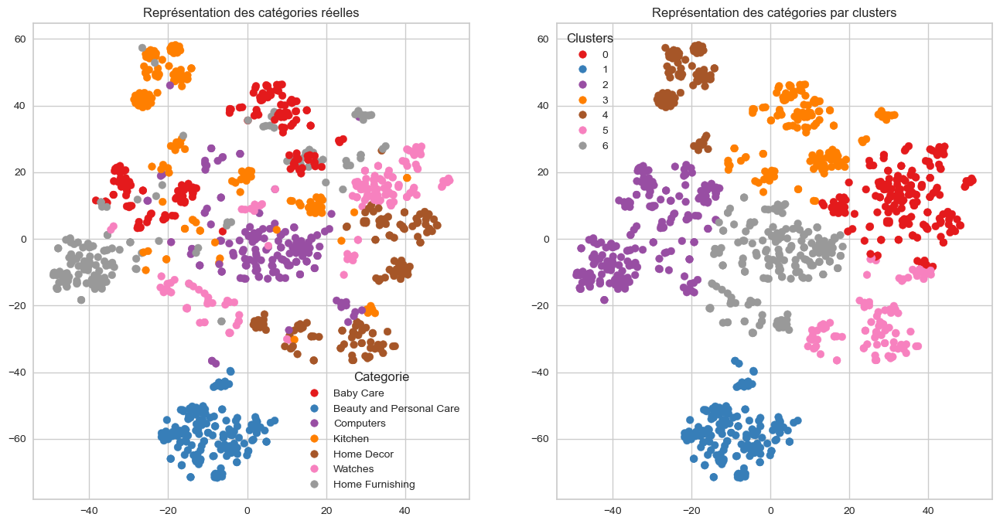

ARI :  0.4418


<IPython.core.display.Javascript object>

In [40]:
TSNE_visu_fct(X_tsne_tf, y_cat_num, labels, ARI)

### Word embedding : Word2Vec : <a class="anchor" id="word"></a>

- Word embedding : Modèle avec une représentation des mots dans un espace avec une forme de similarité entre eux (c'est-à-dire probabiliste), dans lesquels le sens des mots les rapproche dans cet espace, en terme de distances statistiques. C’est un plongement dans un espace de dimension inférieur autour de 20-100 dimensions généralement.
- Word2vec est l'une des techniques les plus populaires pour apprendre les incorporations de mots à l'aide d'un réseau de neurones à deux couches. Son entrée est un corpus de texte et sa sortie est un ensemble de vecteurs. !La bibliothèque Gensim nous permettra de développer des incorporations de mots en entraînant nos propres modèles word2vec sur un corpus personnalisé

In [74]:
w2v_size = 1000  # The number of dimensions of the embeddings and the default is 100: La dimensionnalité de l’espace vectoriel à construire(entre 100 et 1000 en général)
w2v_window = 5  # The maximum distance between a target word and words around the target word. The default window is 5.
w2v_min_count = 1  # The minimum count of words to consider when training the model; words with occurrence less than this count will be ignored. The default for min_count is 5.
w2v_epochs = 200  # Number of iterations (epochs) over the corpus the default value changed from 1 to 5
maxlen = 400  #  length of sentences
sentences = df["sentence_bow_lem"].to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

<IPython.core.display.Javascript object>

In [ ]:
sentences

In [76]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(
    min_count=w2v_min_count, window=w2v_window, vector_size=w2v_size, seed=42, workers=1
)
#sg: The training algorithm, either CBOW(0) or skip gram(1). The default training algorithm is CBOW.
# workers: The number of partitions during training and the default workers is 3.
#  workers=multiprocessing.cpu_count()
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv # get numpy vector of a sentences
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 4161
Word2Vec trained


<IPython.core.display.Javascript object>

In [77]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(
    tokenizer.texts_to_sequences(sentences), maxlen=maxlen, padding="post"
)

num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4162


<IPython.core.display.Javascript object>

Création de la matrice d'embedding

In [78]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 1000
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i = 0
j = 0

for word, idx in word_index.items():
    i += 1
    if word in w2v_words:
        j += 1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]

word_rate = np.round(j / i, 4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (4162, 1000)


<IPython.core.display.Javascript object>

Création du modèle d'embedding

In [79]:
# Création du modèle

input = Input(shape=(len(x_sentences), maxlen), dtype="float64")
word_input = Input(shape=(maxlen,), dtype="float64")
word_embedding = Embedding(
    input_dim=vocab_size,
    output_dim=w2v_size,
    weights=[embedding_matrix],
    input_length=maxlen,
)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)
embed_model = Model([word_input], word_vec)

embed_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 400)]             0         
                                                                 
 embedding (Embedding)       (None, 400, 1000)         4162000   
                                                                 
 global_average_pooling1d (G  (None, 1000)             0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 4,162,000
Trainable params: 4,162,000
Non-trainable params: 0
_________________________________________________________________


<IPython.core.display.Javascript object>

Exécution du modèle

In [80]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

33/33 [==============================] - 0s 12ms/step


(1050, 1000)

<IPython.core.display.Javascript object>

In [82]:
ARI, X_tsne_emb, labels = ARI_fct(embeddings)

ARI :  0.3609 time :  4.0


<IPython.core.display.Javascript object>

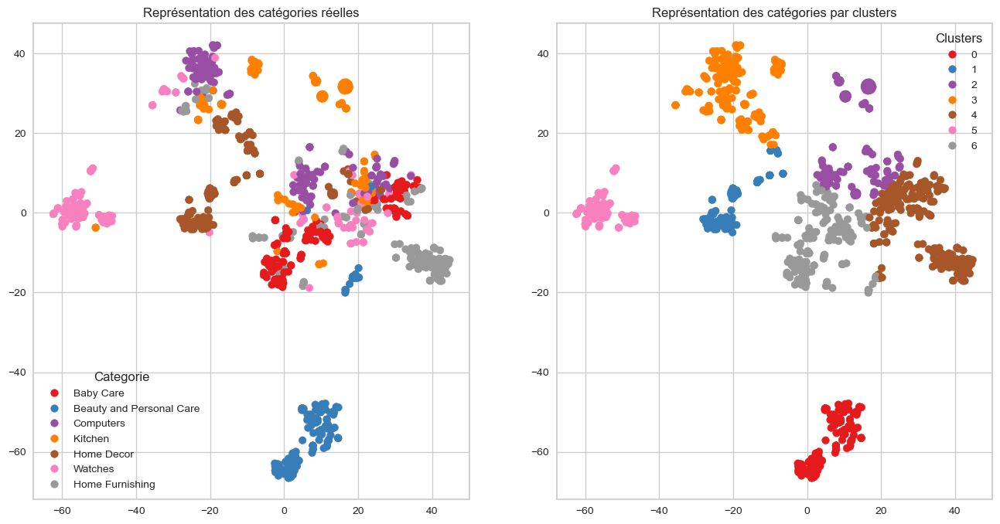

ARI :  0.3609


<IPython.core.display.Javascript object>

In [83]:
TSNE_visu_fct(X_tsne_emb, y_cat_num, labels, ARI)

### BERT : <a class="anchor" id="ber"></a>

- BERT est un modèle d'apprentissage en profondeur qui a donné des résultats de pointe sur une grande variété de tâches de traitement du langage naturel. Il signifie représentations d'encodeur bidirectionnel pour transformateurs. Il a été pré-formé sur Wikipedia et BooksCorpus et nécessite (uniquement) un réglage fin spécifique à la tâche.
utilise une nouvelle technique appelée Masked LM (MLM) : il masque aléatoirement des mots dans la phrase, puis il essaie de les prédire. Le masquage signifie que le modèle regarde dans les deux sens et qu’il utilise le contexte complet de la phrase, à gauche et à droite, afin de prédire le mot masqué

In [41]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import tensorflow_hub as hub

# Bert
import os
import transformers
from transformers import *

os.environ["TF_KERAS"] = "1"

<IPython.core.display.Javascript object>

In [42]:
print("TF Version: ", tf.__version__)
print("Eager mode: ", tf.executing_eagerly())
print("Hub version: ", hub.__version__)
print(
    "GPU is",
    "available"
    if tf.config.experimental.list_physical_devices("GPU")
    else "NOT AVAILABLE",
)

TF Version:  2.10.0
Eager mode:  True
Hub version:  0.12.0
GPU is NOT AVAILABLE


<IPython.core.display.Javascript object>

- Fonctions communes  :

In [43]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length):
    input_ids = []
    token_type_ids = []
    attention_mask = []
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(
            sent,
            add_special_tokens=True,
            max_length=max_length,
            padding="max_length",
            return_attention_mask=True,
            return_token_type_ids=True,
            truncation=True,
            return_tensors="tf",
        )

        input_ids.append(bert_inp["input_ids"][0])
        token_type_ids.append(bert_inp["token_type_ids"][0])
        attention_mask.append(bert_inp["attention_mask"][0])
        bert_inp_tot.append(
            (
                bert_inp["input_ids"][0],
                bert_inp["token_type_ids"][0],
                bert_inp["attention_mask"][0],
            )
        )

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)

    return input_ids, token_type_ids, attention_mask, bert_inp_tot


# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode="HF"):
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences) // batch_size):
        idx = step * batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(
            sentences[idx : idx + batch_size], bert_tokenizer, max_length
        )

        if mode == "HF":  # Bert HuggingFace
            outputs = model.predict(
                [input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred
            )
            last_hidden_states = outputs.last_hidden_state

        if mode == "TFhub":  # Bert Tensorflow Hub
            text_preprocessed = {
                "input_word_ids": input_ids,
                "input_mask": attention_mask,
                "input_type_ids": token_type_ids,
            }
            outputs = model(text_preprocessed)
            last_hidden_states = outputs["sequence_output"]

        if step == 0:
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else:
            last_hidden_states_tot = np.concatenate(
                (last_hidden_states_tot, last_hidden_states)
            )

    features_bert = np.array(last_hidden_states_tot).mean(axis=1)

    time2 = np.round(time.time() - time1, 0)
    print("temps traitement : ", time2)

    return features_bert, last_hidden_states_tot

<IPython.core.display.Javascript object>

- bert-base-uncased

In [44]:
max_length = 100
batch_size = 30
model_type = "bert-base-uncased"
model = TFAutoModel.from_pretrained(model_type)
sentences = df["sentence_dl"].to_list()

2022-10-13 16:38:29.433292: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


<IPython.core.display.Javascript object>

In [45]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(
    model, model_type, sentences, max_length, batch_size, mode="HF"
)

1/1 [==============================] - 2s 2s/step
temps traitement :  85.0


<IPython.core.display.Javascript object>

In [46]:
ARI, X_tsne_bert, labels = ARI_fct(features_bert)

ARI :  0.3304 time :  4.0


<IPython.core.display.Javascript object>

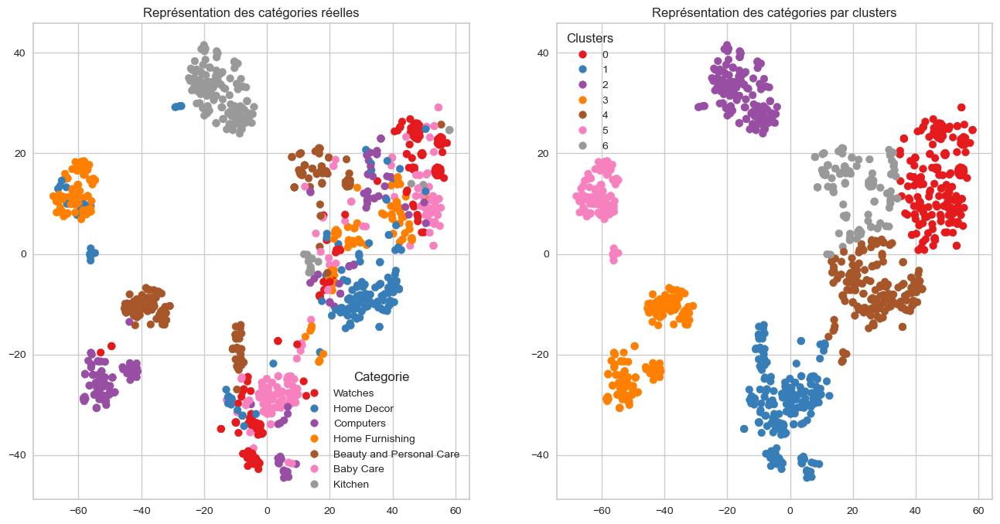

ARI :  0.3304


<IPython.core.display.Javascript object>

In [66]:
TSNE_visu_fct(X_tsne_bert, y_cat_num, labels, ARI)

- BERT hub Tensorflow :

In [47]:
import tensorflow_text

model_url = "https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4"
bert_layer = hub.KerasLayer(model_url, trainable=True)

<IPython.core.display.Javascript object>

In [ ]:
sentences = df["sentence_dl"].to_list()

In [48]:
max_length = 100
batch_size = 10
model_type = "bert-base-uncased"
model = bert_layer

features_bert, last_hidden_states_tot = feature_BERT_fct(
    model, model_type, sentences, max_length, batch_size, mode="TFhub"
)

temps traitement :  97.0


<IPython.core.display.Javascript object>

In [49]:
ARI, X_tsne_hub, labels = ARI_fct(features_bert)

ARI :  0.3221 time :  4.0


<IPython.core.display.Javascript object>

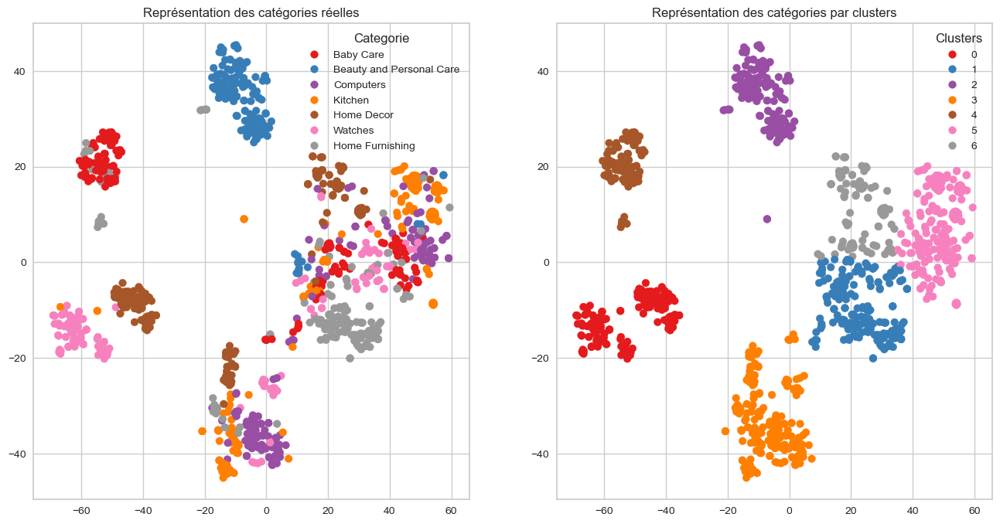

ARI :  0.3221


<IPython.core.display.Javascript object>

In [50]:
TSNE_visu_fct(X_tsne_hub, y_cat_num, labels, ARI)

### USE - Universal Sentence Encoder : <a class="anchor" id="use"></a>

- Universal Sentence Encoder encode le texte dans des vecteurs de grande dimension qui peuvent être utilisés pour la classification de texte, la similarité sémantique, le regroupement et d'autres tâches en langage naturel. L'encodeur de phrase universel pré-formé est disponible publiquement dans Tensorflow-hub. 
On va utiliser : Universal Sentence Encoder family
Le module ne nécessite pas de prétraitement des données avant d'appliquer le module, il effectue le meilleur prétraitement de saisie de texte à l'intérieur du graphique.

In [54]:
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

<IPython.core.display.Javascript object>

In [55]:
def feature_USE_fct(sentences, b_size):
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences) // batch_size):
        idx = step * batch_size
        feat = embed(sentences[idx : idx + batch_size])

        if step == 0:
            features = feat
        else:
            features = np.concatenate((features, feat))

    time2 = np.round(time.time() - time1, 0)
    return features

<IPython.core.display.Javascript object>

In [56]:
batch_size = 30
features_USE = feature_USE_fct(sentences, batch_size)

<IPython.core.display.Javascript object>

In [57]:
features_USE.shape

(1050, 512)

<IPython.core.display.Javascript object>

In [58]:
ARI, X_tsne_use, labels = ARI_fct(features_USE)

ARI :  0.4401 time :  4.0


<IPython.core.display.Javascript object>

In [60]:
X_tsne_use.shape

(1050, 2)

<IPython.core.display.Javascript object>

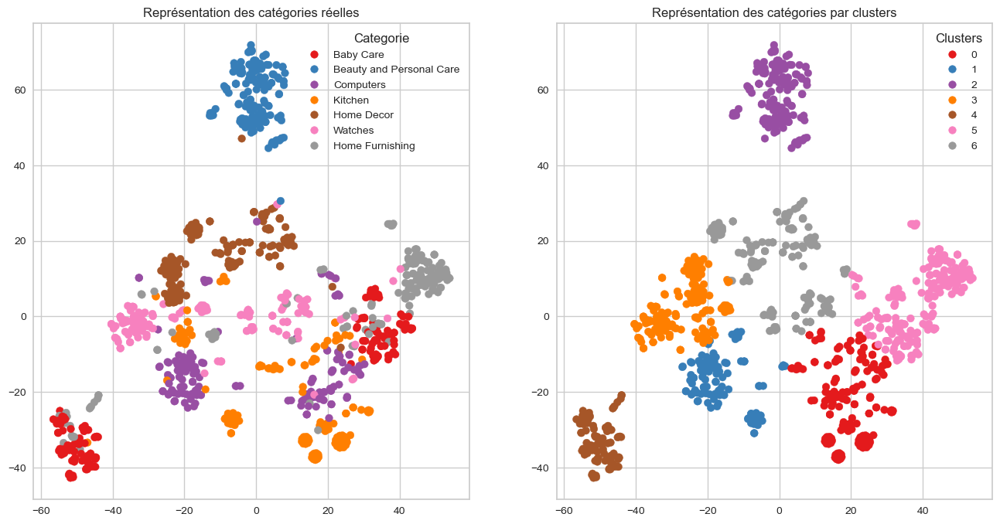

ARI :  0.4401


<IPython.core.display.Javascript object>

In [59]:
TSNE_visu_fct(X_tsne_use, y_cat_num, labels, ARI)

### Aprentissage supervisée : Classification avec SVM : <a class="anchor" id="sup"></a>

In [1013]:
ctf

TfidfVectorizer(max_df=0.95, stop_words='english')

<IPython.core.display.Javascript object>

In [1009]:
features_names = ctf.get_feature_names()  # to get the names of the tokens
dense = ctf_transform.todense()  # convert sparse matrix to numpy array
denselist = dense.tolist()  # convert array to list
df2 = pd.DataFrame(denselist, columns=features_names)  # convert to dataframe
df2.head()

,000,001,005,006,011,01433cmgy,01727lpln,01741lpln,01784bmly,03918cmly,04,04615cmgy,050,052,05712lmly,05tg,06,063,06362cmgy,064,069,07034lmli,074,08,085,09,09321cmgy,099,10,100,1000,1001,101,101b0101,1033,1038,104,1042,1045,1049,105key,107,1071,1075,107750,108,1085,10890,1099,109b0109,10btsc2012gb,11,110,1100,11000026,112,1132,1141ym22,1142301,1143,1149,1150,1153,1155,119,1199,11n,12,120,1200,12011ppgw,121,1216,122,12399,1240sg,1241ea,125,125prog,126,1290,1295,1299,12v,13,1333,13400,1345,1350,138,1395,13cm,14,140,14001,144,1449,145,147,149,...,welhouse,west,western,wet,wglass,wheel,wheeled,wher,white,whiteherbs,wide,widely,width,wild,win10,wind,window,windsor,wine,winger,wining,wink,winner,winter,wipe,wiping,wire,wired,wireless,wisdom,wish,withstands,wkhs0164s,wm64,wma,wn3000rp,wok,woman,wonderchef,wonderful,wood,wooden,woodino,woody,wool,word,work,worked,working,workmanship,world,worn,worry,worshipper,woven,wow,wq18,wr3000n,wr702n,wrap,wrapped,wrapper,wring,wrinkle,wrist,write,ws331c,wy16b,x002,x6,xemex,xyz,y430g,yardley,yarn,ybscr557,year,yellow,yes,ygs,ygskb95,yiboo,yield,york,young,youth,youthful,yuva,yves,zaicus,zero,zikrak,zinc,zingalalaa,zip,zipper,zone,zoom,zora,zyxel
0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0408,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0684,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0570,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0714,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0634,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0676,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1763,0.0691,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,

<IPython.core.display.Javascript object>

In [65]:
df2.shape

(1050, 4594)

<IPython.core.display.Javascript object>

In [ ]:
df2.groupby("cluster").count()["class"]

 nous ne voyons ici que des zéros, ce qui est normal puisque sur ces 4594 tokens, seuls quelques-uns sont présent dans chaque description.

Une machine à vecteurs de support (SVM) est un algorithme permettant de réaliser des tâches de classification ou de régression, très en vogue il y a quelques années mais depuis largement surpassé par les réseaux de neurones profonds. Néanmoins, il fonctionne bien sur des données textuelles. Son principe est de séparer au maximum les exemples tirés des différentes classes, on le qualifie de hard margin classifier

In [66]:
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, f1_score

X_train, X_test, y_train, y_test = train_test_split(df2, df.categorie, test_size=0.3)

clf = LinearSVC()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))

                          precision    recall  f1-score   support

               Baby Care       0.95      0.86      0.90        44
Beauty and Personal Care       0.94      0.96      0.95        47
               Computers       0.98      1.00      0.99        45
              Home Decor       0.87      0.94      0.90        35
         Home Furnishing       0.96      0.96      0.96        53
                 Kitchen       0.98      0.98      0.98        43
                 Watches       1.00      0.98      0.99        48

                accuracy                           0.96       315
               macro avg       0.95      0.95      0.95       315
            weighted avg       0.96      0.96      0.96       315



<IPython.core.display.Javascript object>

In [67]:
print(f1_score(y_test, y_pred, average="micro"))

0.9555555555555556


<IPython.core.display.Javascript object>

In [68]:
print(confusion_matrix(y_test, y_pred))

[[38  1  0  2  2  1  0]
 [ 0 45  1  1  0  0  0]
 [ 0  0 45  0  0  0  0]
 [ 0  2  0 33  0  0  0]
 [ 2  0  0  0 51  0  0]
 [ 0  0  0  1  0 42  0]
 [ 0  0  0  1  0  0 47]]


<IPython.core.display.Javascript object>

<AxesSubplot:title={'center':'SVM Confusion Matrix'}>

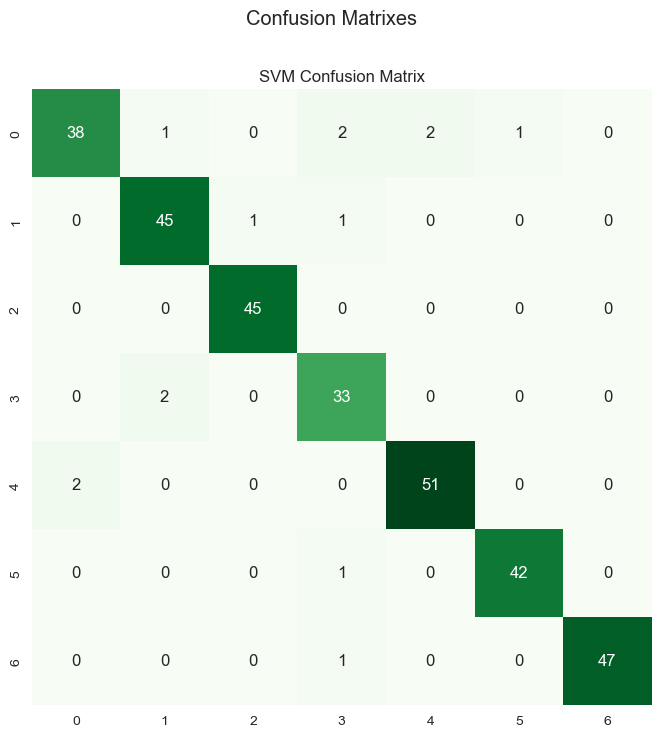

<IPython.core.display.Javascript object>

In [69]:
cm_svm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 8))

plt.suptitle("Confusion Matrixes")

plt.title("SVM Confusion Matrix")
sns.heatmap(cm_svm, cbar=False, annot=True, cmap="Greens", fmt="d")

### Traitement des images : <a class="anchor" id="image"></a>

In [84]:
from sklearn import preprocessing
from matplotlib.image import imread
import cv2

<IPython.core.display.Javascript object>

In [85]:
path = "/Users/hananemaghlazi/Desktop/Datascientist/Projets_Formation/P6_MAGHLAZI_Hanane/Flipkart/Images/"
path

'/Users/hananemaghlazi/Desktop/Datascientist/Projets_Formation/P6_MAGHLAZI_Hanane/Flipkart/Images/'

<IPython.core.display.Javascript object>

In [86]:
# this list holds all the image filename
list_photos = []

# creates a ScandirIterator aliased as files
with os.scandir(path) as files:
    # loops through each file in the directory
    for file in files:
        if file.name.endswith(".jpg"):
            # adds only the image files to the flowers list
            list_photos.append(file.name)

<IPython.core.display.Javascript object>

In [282]:
len(list_photos)

1050

<IPython.core.display.Javascript object>

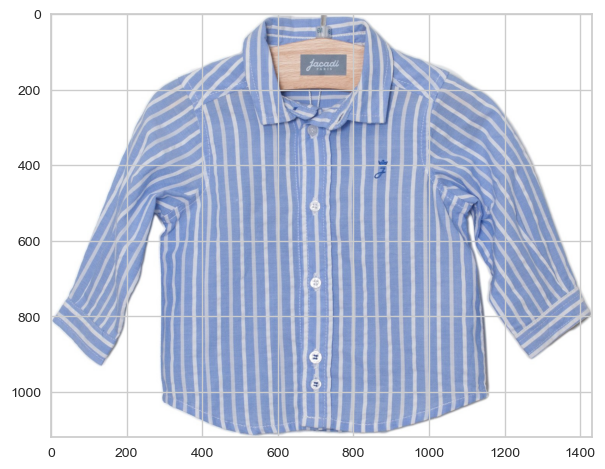

<IPython.core.display.Javascript object>

In [974]:
# Extraire une image avec imageread et l'afficher
image = imread(
    "//Users/hananemaghlazi/Desktop/Datascientist/Projets_Formation/P6_MAGHLAZI_Hanane/Flipkart/Images/4b500e244f11a45f5171bd3665413044.jpg"
)
plt.imshow(image)

In [975]:
# Taille de l'image
image.shape

(1120, 1431, 3)

<IPython.core.display.Javascript object>

Entrainement sur une image

In [996]:
from PIL import Image

# Charger une image avec imageopen
img = Image.open(
    "/Users/hananemaghlazi/Desktop/Datascientist/Projets_Formation/P6_MAGHLAZI_Hanane/Flipkart/Images/0a3b5fdf77a361c2d7d9b29c259b8c4e.jpg"
)
# Afficher l'image chargée
img.show()

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


<IPython.core.display.Javascript object>

In [92]:
# Récupérer et afficher la taille de l'image (en pixels)
w, h = img.size
print("Largeur : {} px, hauteur : {} px".format(w, h))

Largeur : 999 px, hauteur : 1100 px


<IPython.core.display.Javascript object>

In [93]:
# Afficher son mode de quantification
print("Format des pixels : {}".format(img.mode))

# Récupérer et afficher la valeur du pixel à une position précise
px_value = img.getpixel((20, 100))
print("Valeur du pixel situé en (20,100) : {}".format(px_value))

Format des pixels : RGB
Valeur du pixel situé en (20,100) : (255, 255, 255)


<IPython.core.display.Javascript object>

In [94]:
# Récupérer les valeurs de tous les pixels sous forme d'une matrice
mat = np.array(img)
mat

# Afficher la taille de la matrice de pixels
print("Taille de la matrice de pixels : {}".format(mat.shape))

Taille de la matrice de pixels : (1100, 999, 3)


<IPython.core.display.Javascript object>

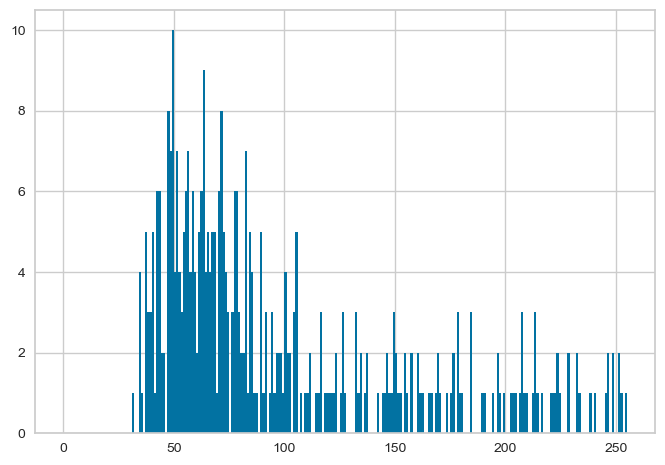

<IPython.core.display.Javascript object>

In [95]:
n, bins, patches = plt.hist(img.histogram(), bins=range(256))
plt.show()

- Visualisation des images

In [97]:
# view the first 10 poducts entries
print(list_photos[:10])

['aa68675f50a0551b8dadb954017a50a1.jpg', '037c2402fee39fbc80433935711d1383.jpg', '42643c1c9403f67921a18654bcf45ead.jpg', '53f4bc7d7321f5c41de6b86e41f13e80.jpg', 'b144a363c107c7bdd91f32d6e28ba6f2.jpg', 'db3e2eeb4fe90d4755f2911d661eae95.jpg', '9a9402ad55d079c86c302521816b7b0e.jpg', '42a8fef62716772c391fbdd148cc9c16.jpg', '503bb08f7bdf6a395ec564dd1dc83619.jpg', '42770faa04bfcf2b62e7ef335e1b1965.jpg']


<IPython.core.display.Javascript object>

- Création des labels des photos à partir du nom des images

In [ ]:
list_photos

In [100]:
label = df.loc[:, ["image", "categorie"]]
data = pd.DataFrame()
data["image"] = list_photos
data = pd.merge(data, label, on="image")
le = preprocessing.LabelEncoder()
data["label"] = le.fit_transform(data["categorie"])
data.head()

,image,categorie,label
0,aa68675f50a0551b8dadb954017a50a1.jpg,Kitchen,5
1,037c2402fee39fbc80433935711d1383.jpg,Home Furnishing,4
2,42643c1c9403f67921a18654bcf45ead.jpg,Baby Care,0
3,53f4bc7d7321f5c41de6b86e41f13e80.jpg,Home Decor,3
4,b144a363c107c7bdd91f32d6e28ba6f2.jpg,Watches,6


<IPython.core.display.Javascript object>

In [102]:
data.shape

(1050, 3)

<IPython.core.display.Javascript object>

In [101]:
data.groupby("label").count()

,image,categorie
label,,
0,150,150
1,150,150
2,150,150
3,150,150
4,150,150
5,150,150
6,150,150


<IPython.core.display.Javascript object>

- Affichage d'exemples d'images par label: 

In [103]:
data[data["categorie"] == "Computers"]

,image,categorie,label
6,9a9402ad55d079c86c302521816b7b0e.jpg,Computers,2
19,473b1ab1abe21826c41efa1584a88a63.jpg,Computers,2
34,6136976dc5a433cdf8e2559b8510bdce.jpg,Computers,2
50,70af4c3c05688d8400632e134f258b98.jpg,Computers,2
57,9a8fa4fd6524ada03411b033a9daadc1.jpg,Computers,2
70,86a39f77de21aa9654e8ea03335244fc.jpg,Computers,2
74,01089dc3618a0ab7304d784ef400b83d.jpg,Computers,2
79,621a88993a7033df3440ec816c2e386f.jpg,Computers,2
81,6634de7b39a5b0658c74ab098450096d.jpg,Computers,2
88,e365b55f806e5d0abe0094a9f2590e33.jpg,Computers,2


<IPython.core.display.Javascript object>

Baby Care
-------


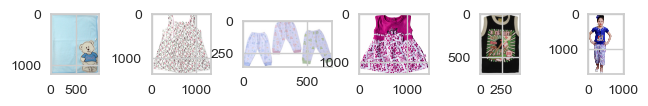

Beauty and Personal Care
-------


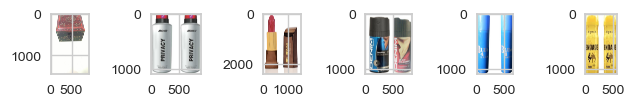

Computers
-------


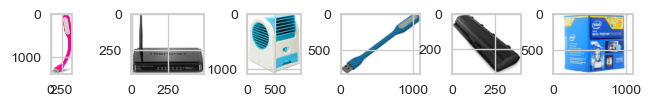

Kitchen
-------


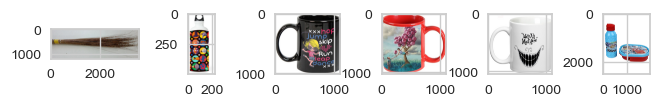

Home Decor
-------


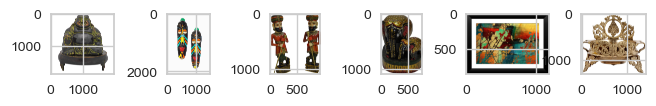

Watches
-------


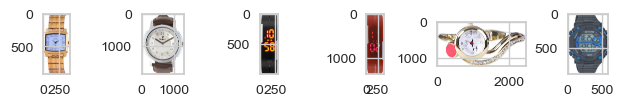

Home Furnishing
-------


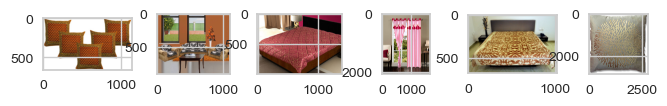

<IPython.core.display.Javascript object>

In [104]:
def list_fct(name):
    list_image_name = [
        list_photos[i] for i in range(len(data)) if data["categorie"][i] == name
    ]
    return list_image_name


list_Beauty = [
    list_photos[i]
    for i in range(len(data))
    if data["categorie"][i] == "Beauty and Personal Care"
]
list_Computers = [
    list_photos[i] for i in range(len(data)) if data["categorie"][i] == "Computers"
]


list_Baby = [
    list_photos[i] for i in range(len(data)) if data["categorie"][i] == "Baby Care"
]
list_Home = [
    list_photos[i] for i in range(len(data)) if data["categorie"][i] == "Home Decor"
]
list_Watches = [
    list_photos[i] for i in range(len(data)) if data["categorie"][i] == "Watches"
]

list_Home = [
    list_photos[i]
    for i in range(len(data))
    if data["categorie"][i] == "Home Furnishing"
]
list_Kichen = [
    list_photos[i] for i in range(len(data)) if data["categorie"][i] == "Kitchen"
]

for name in l_cat:
    print(name)
    print("-------")
    for i in range(6):
        plt.subplot(6, 6, 1 + i)

        filename = path + list_fct(name)[i]
        image = imread(filename)
        plt.imshow(image)
    plt.show()

In [105]:
data.rename(columns={"image": "image_file", "categorie": "label_name"}, inplace=True)
data.head()

,image_file,label_name,label
0,aa68675f50a0551b8dadb954017a50a1.jpg,Kitchen,5
1,037c2402fee39fbc80433935711d1383.jpg,Home Furnishing,4
2,42643c1c9403f67921a18654bcf45ead.jpg,Baby Care,0
3,53f4bc7d7321f5c41de6b86e41f13e80.jpg,Home Decor,3
4,b144a363c107c7bdd91f32d6e28ba6f2.jpg,Watches,6


<IPython.core.display.Javascript object>

### SIFT : <a class="anchor" id="sift"></a>

 - l'algorithme SIFT (Scale-invariant feature transform). Cette méthode, développée en 1999 et très populaire dans le domaine de la vision par ordinateur, permet d'extraire des features (ou points d'intérêt) de l'image et de calculer leurs descripteurs. 

- Détermination et affichage des descripteurs SIFT

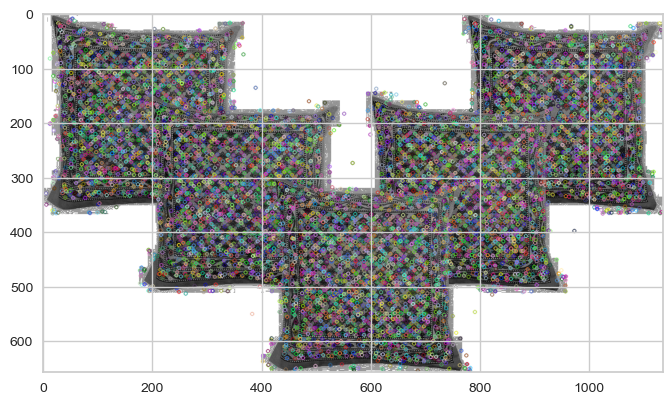

Descripteurs :  (11002, 128)

[[  0.   0.   2. ...   2.   2.  16.]
 [ 27.   2.   2. ...   0.   4.  33.]
 [139.  44.   5. ...   3.   0.   0.]
 ...
 [ 13.  21.   1. ...   0.   1.   4.]
 [  1.   3.   3. ...   0.   0.   0.]
 [ 29.  27.  11. ...   4.  26.   3.]]


<IPython.core.display.Javascript object>

In [106]:
sift = cv2.SIFT_create()  # Création de descripteur
# sift = cv2.xfeatures2d.SIFT_create()
image = cv2.imread(path + list_photos[1], 0)  # convert in gray
image = cv2.equalizeHist(image)  # equalize image histogram
kp, des = sift.detectAndCompute(image, None)
img = cv2.drawKeypoints(image, kp, image)
plt.imshow(img)
plt.show()
print("Descripteurs : ", des.shape)  # taille de descripteur
print()
print(des)

* L'image contient 11002 descripteurs
* Chaque descripteur est un vecteur de longueur 128

- Pré-traitement des images via SIFT

- Créations des descripteurs de chaque image
* Pour chaque image passage en gris et equalisation
* création d'une liste de descripteurs par image ("sift_keypoints_by_img") qui sera utilisée pour réaliser les histogrammes par image
* création d'une liste de descripteurs pour l'ensemble des images ("sift_keypoints_all") qui sera utilisé pour créer les clusters de descripteurs

In [107]:
sift_keypoints = []
temps1 = time.time()
# sift = cv2.xfeatures2d.SIFT_create(500)
sift = cv2.SIFT_create(500)
for image_num in range(len(list_photos)):
    if image_num % 100 == 0:
        print(image_num)
    image = cv2.imread(path + list_photos[image_num], 0)  # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = cv2.equalizeHist(image)  # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints.append(des)

sift_keypoints_by_img = np.asarray(sift_keypoints)
sift_keypoints_all = np.concatenate(sift_keypoints_by_img, axis=0)

print()
print("Nombre de descripteurs : ", sift_keypoints_all.shape)

duration1 = time.time() - temps1
print("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000

Nombre de descripteurs :  (517351, 128)
temps de traitement SIFT descriptor :           332.12 secondes


<IPython.core.display.Javascript object>

Les images contiennent 517351 descripteurs 
Chaque descripteur est un vecteur de longueur 128

- Création des clusters de descripteurs
* Utilisation de MiniBatchKMeans pour obtenir des temps de traitement raisonnables

In [108]:
# Determination number of clusters pour chaque descripteur
temps1 = time.time()
# Définition du nombre k : racine carré du nombre totale des descripteurs
k = int(round(np.sqrt(len(sift_keypoints_all)), 0))
print("Nombre de clusters estimés : ", k)
print("Création de", k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3 * k, random_state=0)
kmeans.fit(sift_keypoints_all)

duration1 = time.time() - temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  719
Création de 719 clusters de descripteurs ...
temps de traitement kmeans :             3.80 secondes


<IPython.core.display.Javascript object>

- Création des features des images
* Pour chaque image : 
   - prédiction des numéros de cluster de chaque descripteur
   - création d'un histogramme = comptage pour chaque numéro de cluster du nombre de descripteurs de l'image

Features d'une image = Histogramme d'une image = Comptage pour une image du nombre de descripteurs par cluster

In [109]:
# Creation of histograms (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)# prédire les numéros de cluster de chaque descripteur
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des # pondéré par le nombre des descripteurs
    return hist


# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")


0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :             6.54 secondes


<IPython.core.display.Javascript object>

In [110]:
im_features.shape  # on a créé les features : 719 features pour chacune des images donc 719 valeur par image

(1050, 719)

<IPython.core.display.Javascript object>

- Réduction de dimension PCA
* La réduction PCA permet de créer des features décorrélées entre elles, et de diminuer leur dimension, tout en gardant un niveau de variance expliquée élevé (99%)
* L'impact est une meilleure séparation des données via le T-SNE et une réduction du temps de traitement du T-SNE

In [111]:
print("Dimensions dataset avant réduction PCA : ", im_features.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca_sift = pca.fit_transform(im_features)
print("Dimensions dataset après réduction PCA : ", feat_pca_sift.shape)

Dimensions dataset avant réduction PCA :  (1050, 719)
Dimensions dataset après réduction PCA :  (1050, 499)


<IPython.core.display.Javascript object>

-  Réduction de dimension T-SNE
* Réduction de dimension en 2 composantes T-SNE pour affichage en 2D des images

In [112]:
tsne = manifold.TSNE(
    n_components=2, perplexity=30, n_iter=2000, init="random", random_state=6
)
X_tsne = tsne.fit_transform(feat_pca_sift)  # sur données pca

df_tsne_sift = pd.DataFrame(X_tsne[:, 0:2], columns=["tsne1", "tsne2"])
df_tsne_sift["class"] = data["label_name"]
print(df_tsne_sift.shape)

(1050, 3)


<IPython.core.display.Javascript object>

- Analyse visuelle : affichage T-SNE selon catégories d'images

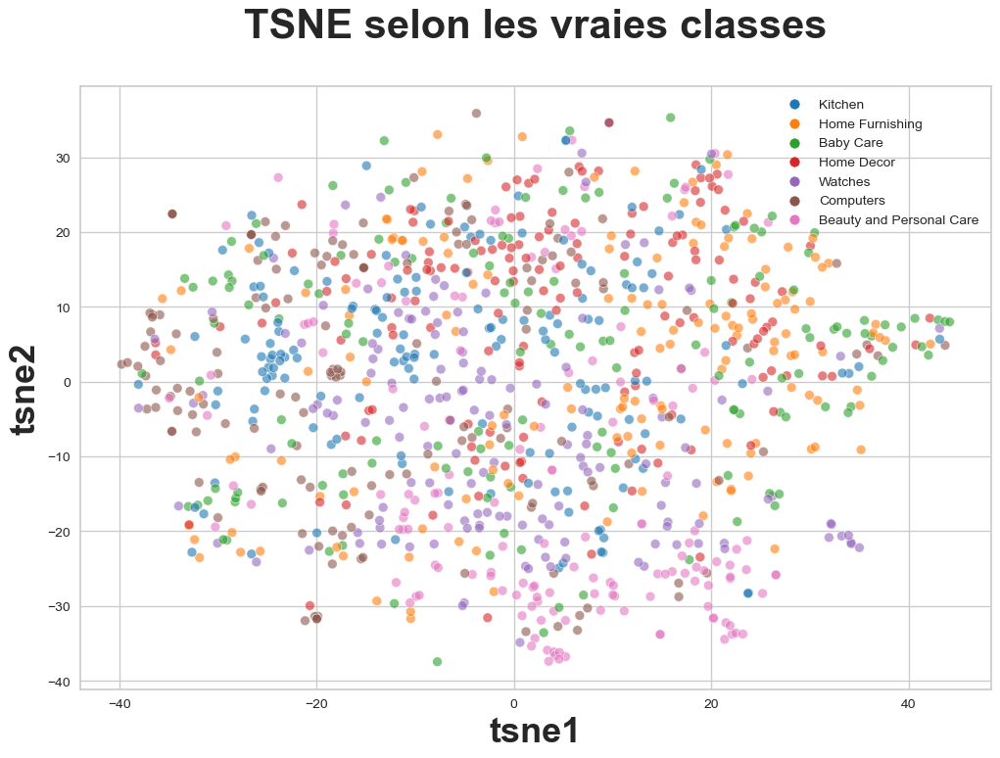

<IPython.core.display.Javascript object>

In [113]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x="tsne1",
    y="tsne2",
    hue="class",
    data=df_tsne_sift,
    legend="brief",
    palette=sns.color_palette("tab10", n_colors=7),
    s=50,
    alpha=0.6,
)

plt.title("TSNE selon les vraies classes", fontsize=30, pad=35, fontweight="bold")
plt.xlabel("tsne1", fontsize=26, fontweight="bold")
plt.ylabel("tsne2", fontsize=26, fontweight="bold")
plt.legend(loc="best")

plt.show()

séparation partielle mais c pas claire

- Analyse mesures : similarité entre catégories et clusters

-  Création de clusters à partir du T-SNE

In [114]:
cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne_sift["cluster"] = cls.labels_
print(df_tsne_sift.shape)

(1050, 4)


<IPython.core.display.Javascript object>

-  Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters

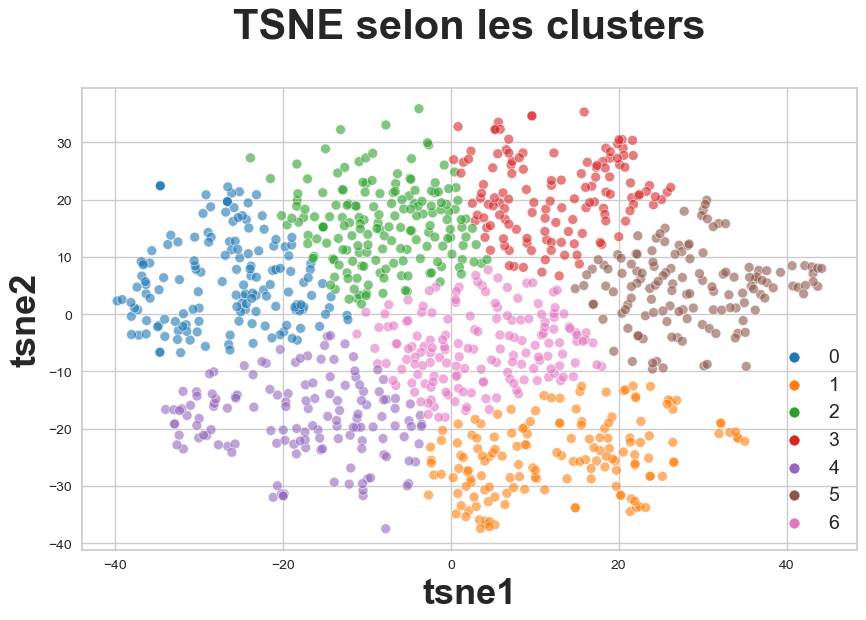

ARI :  0.062


<IPython.core.display.Javascript object>

In [116]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x="tsne1",
    y="tsne2",
    hue="cluster",
    palette=sns.color_palette("tab10", n_colors=7),
    s=50,
    alpha=0.6,
    data=df_tsne_sift,
    legend="brief",
)

plt.title("TSNE selon les clusters", fontsize=30, pad=35, fontweight="bold")
plt.xlabel("tsne1", fontsize=26, fontweight="bold")
plt.ylabel("tsne2", fontsize=26, fontweight="bold")
plt.legend(prop={"size": 14})

plt.show()

labels = data["label"]
print("ARI : ", np.round(metrics.adjusted_rand_score(labels, cls.labels_), 3))

-  Analyse par classes
* La matrice de confusion doit être transformée pour mettre avoir en colonne le même ordre des catégories supposées qu'en ligne
* Cette transformation atteint ses limites pour les 2 catégories "shine" et "sunshine" qui sont peu séparées (donc elle a été réalisée manuellement au lieu d'utiliser la fonction "argmax")

In [117]:
df_tsne_sift.groupby("cluster").count()["class"]

cluster
0    154
1    154
2    174
3    131
4    139
5    136
6    162
Name: class, dtype: int64

<IPython.core.display.Javascript object>

In [118]:
conf_mat_sift = metrics.confusion_matrix(labels, cls.labels_)
print(conf_mat_sift)

[[20 13 20 18 20 38 21]
 [ 9 72 15 15 21  5 13]
 [54 10 25 10 28  9 14]
 [ 8  5 39 38  9 25 26]
 [10  9 18 22 22 49 20]
 [36 11 38 19 13  6 27]
 [17 34 19  9 26  4 41]]


<IPython.core.display.Javascript object>

In [119]:
# cross tabulation table
df_cross = pd.DataFrame({"labels": labels, "cluster": cls.labels_})
ct = pd.crosstab(df_cross["labels"], df_cross["cluster"])
ct

cluster,0,1,2,3,4,5,6
labels,,,,,,,
0,20,13,20,18,20,38,21
1,9,72,15,15,21,5,13
2,54,10,25,10,28,9,14
3,8,5,39,38,9,25,26
4,10,9,18,22,22,49,20
5,36,11,38,19,13,6,27
6,17,34,19,9,26,4,41


<IPython.core.display.Javascript object>

<AxesSubplot:>

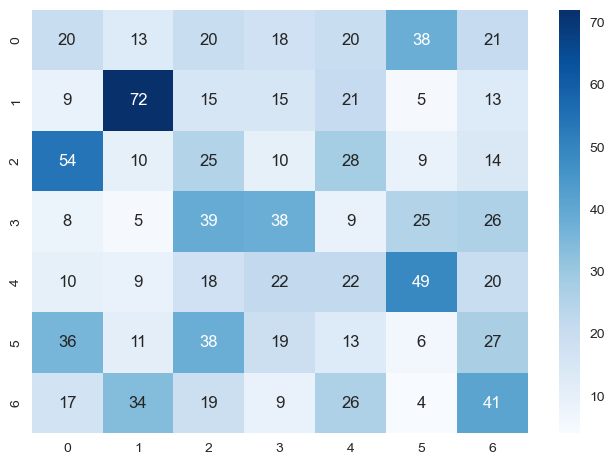

<IPython.core.display.Javascript object>

In [120]:
sns.heatmap(conf_mat_sift, annot=True, cmap="Blues")

In [123]:
print(metrics.classification_report(labels, cls.labels_))

              precision    recall  f1-score   support

           0       0.13      0.13      0.13       150
           1       0.47      0.48      0.47       150
           2       0.14      0.17      0.15       150
           3       0.29      0.25      0.27       150
           4       0.16      0.15      0.15       150
           5       0.04      0.04      0.04       150
           6       0.25      0.27      0.26       150

    accuracy                           0.21      1050
   macro avg       0.21      0.21      0.21      1050
weighted avg       0.21      0.21      0.21      1050



<IPython.core.display.Javascript object>

In [126]:
l_cat

['Baby Care',
 'Beauty and Personal Care',
 'Computers',
 'Kitchen',
 'Home Decor',
 'Watches',
 'Home Furnishing']

<IPython.core.display.Javascript object>

<AxesSubplot:>

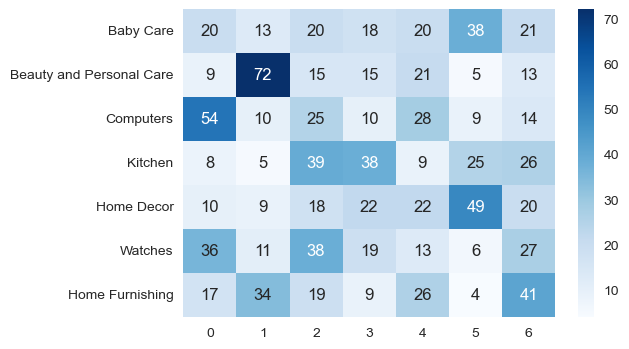

<IPython.core.display.Javascript object>

In [127]:
df_cm_sift = pd.DataFrame(
    conf_mat_sift,
    index=[label for label in l_cat],
    columns=[i for i in "0123456"],
)
plt.figure(figsize=(6, 4))
sns.heatmap(df_cm_sift, annot=True, cmap="Blues")

### ORB : <a class="anchor" id="orb"></a>

ORB est une fusion du détecteur de points clés FAST et du descripteur BRIEF avec quelques fonctionnalités supplémentaires pour améliorer les performances. FAST correspond aux caractéristiques du test de segment accéléré utilisé pour détecter les caractéristiques de l'image fournie. Il utilise également une pyramide pour produire des caractéristiques multi-échelles. 

The default lenght of each ORB descriptor is 32 bytes. Each byte contains 8 pixel intensity comparisons as explained in the official paper:

Descripteurs image1 (500, 32)

[[ 62  13 106 ... 171 112 224]
 [  3  59  67 ...  15 121 221]
 [160 225  60 ... 154 135 170]
 ...
 [ 24 135  29 ... 194 165  40]
 [169 186 254 ... 221 127 251]
 [169  73  42 ...  24  88 190]]
Descripteurs image2 (500, 32)

[[ 11 221 106 ...  30 189 223]
 [130 176  57 ...   8 133 250]
 [162 132  40 ...   8 221 202]
 ...
 [ 41  16 225 ... 202 210 184]
 [157   5  77 ... 168  80  32]
 [ 57   7 106 ... 138 248 133]]
matches 
4


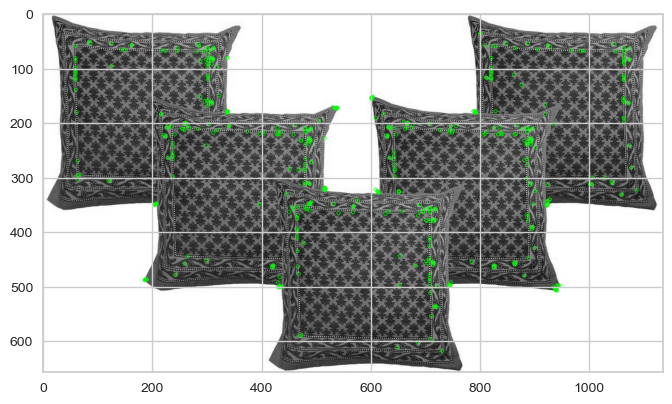

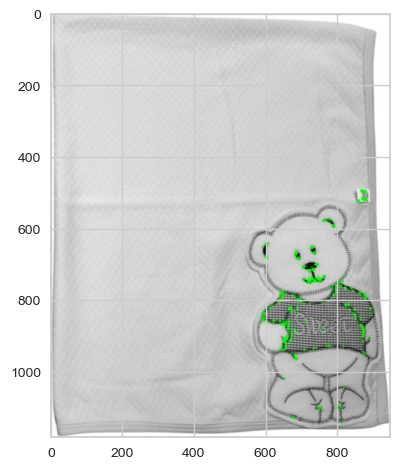

<IPython.core.display.Javascript object>

In [128]:
# Read image
img1 = cv2.imread(path + list_photos[1])
img2 = cv2.imread(path + list_photos[2])

# Initiate ORB detector
orb = cv2.ORB_create()

# Convering to Gray
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# find the detectors and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# no.of descriptors
print("Descripteurs image1", des1.shape)
print()
print(des1)
print("Descripteurs image2", des2.shape)
print()
print(des2)
# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

# Create images with keypoints
img1 = cv2.drawKeypoints(img1, kp1, img1, color=(0, 255, 0))
cv2.imwrite("2orb_keypoints.jpg", img1)

img2 = cv2.drawKeypoints(img2, kp2, img2, color=(0, 255, 0))
cv2.imwrite("3orb_keypoints.jpg", img2)

# Apply ratio test
good = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good.append([m])

print("matches ")
print(len(good))


plt.imshow(img1)
plt.show()
plt.imshow(img2)
plt.show()

- Pré-traitement des images via ORB :
  * Créations des descripteurs de chaque image

In [129]:
orb_keypoints = []
temps1 = time.time()
orb = cv2.ORB_create(500)

for image_num in range(len(list_photos)):
    if image_num % 100 == 0:
        print(image_num)
    image = cv2.imread(path + list_photos[image_num], 0)  # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = cv2.equalizeHist(image)  # equalize image histogram
    kp, des = orb.detectAndCompute(res, None)
    orb_keypoints.append(des)

orb_keypoints_by_img = np.asarray(orb_keypoints)
orb_keypoints_all = np.concatenate(orb_keypoints_by_img, axis=0)

print()
print("Nombre de descripteurs : ", orb_keypoints_all.shape)

duration1 = time.time() - temps1
print("temps de traitement ORB descriptor : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000

Nombre de descripteurs :  (520145, 32)
temps de traitement ORB descriptor :            30.53 secondes


<IPython.core.display.Javascript object>

- Création des clusters de descripteurs

In [130]:
# Determination number of clusters
temps1 = time.time()

k = int(round(np.sqrt(len(orb_keypoints_all)), 0))
print("Nombre de clusters estimés : ", k)
print("Création de", k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3 * k, random_state=0)
kmeans.fit(orb_keypoints_all)

duration1 = time.time() - temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  721
Création de 721 clusters de descripteurs ...
temps de traitement kmeans :             2.60 secondes


<IPython.core.display.Javascript object>

- Création des features des images : 

In [131]:
temps1 = time.time()
# Creation of a matrix of histograms
hist_vectors = []

for i, image_desc in enumerate(orb_keypoints_by_img):
    if i % 100 == 0:
        print(i)
    hist = build_histogram(kmeans, image_desc, i)  # calculates the histogram
    hist_vectors.append(hist)  # histogram is the feature vector

im_features_orb = np.asarray(hist_vectors)

duration1 = time.time() - temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :             6.15 secondes


<IPython.core.display.Javascript object>

ACP : 

In [132]:
print("Dimensions dataset avant réduction PCA : ", im_features_orb.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca_orb = pca.fit_transform(im_features_orb)
print("Dimensions dataset après réduction PCA : ", feat_pca_orb.shape)

Dimensions dataset avant réduction PCA :  (1050, 721)
Dimensions dataset après réduction PCA :  (1050, 580)


<IPython.core.display.Javascript object>

Réduction de dimension T-SNE : 

In [133]:
X_tsne_orb = tsne.fit_transform(feat_pca_orb)

df_tsne_orb = pd.DataFrame(X_tsne_orb[:, 0:2], columns=["tsne1", "tsne2"])
df_tsne_orb["class"] = data["label_name"]
print(df_tsne_orb.shape)

(1050, 3)


<IPython.core.display.Javascript object>

- Analyse visuelle : affichage T-SNE selon catégories d'images : 

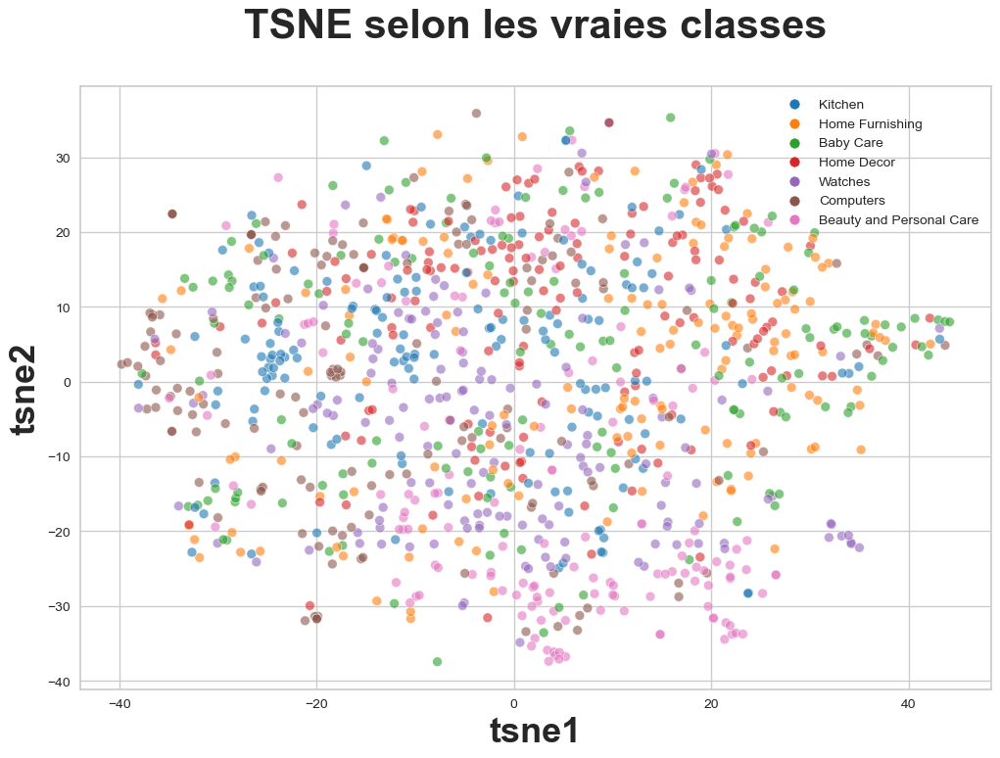

<IPython.core.display.Javascript object>

In [134]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x="tsne1",
    y="tsne2",
    hue="class",
    data=df_tsne_orb,
    legend="brief",
    palette=sns.color_palette("tab10", n_colors=7),
    s=50,
    alpha=0.6,
)

plt.title("TSNE selon les vraies classes", fontsize=30, pad=35, fontweight="bold")
plt.xlabel("tsne1", fontsize=26, fontweight="bold")
plt.ylabel("tsne2", fontsize=26, fontweight="bold")
plt.legend(loc="best")

plt.show()

- Création de clusters à partir du T-SNE : 

In [135]:
cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne_orb)

df_tsne_orb["cluster"] = cls.labels_
print(df_tsne_orb.shape)

(1050, 4)


<IPython.core.display.Javascript object>

- Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters : 

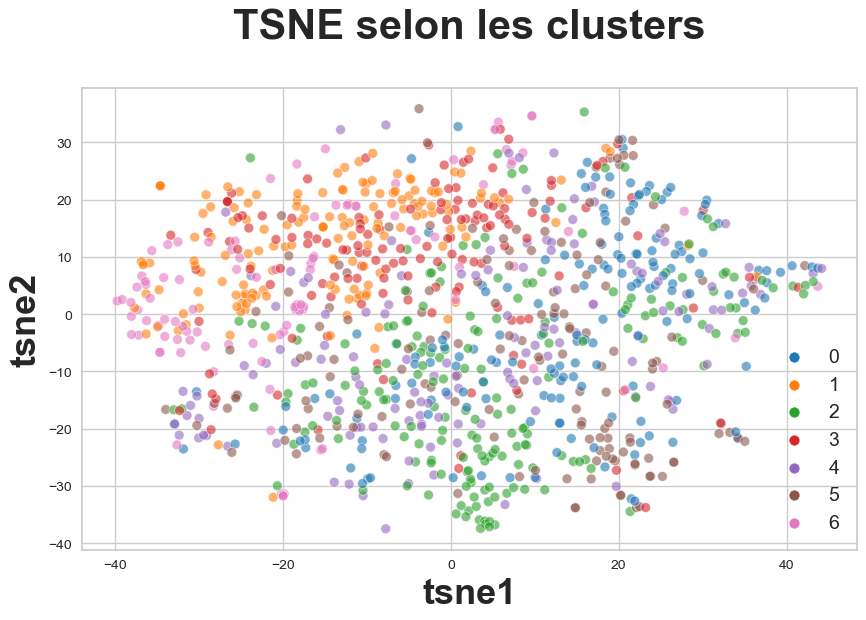

ARI :  0.031


<IPython.core.display.Javascript object>

In [137]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x="tsne1",
    y="tsne2",
    hue="cluster",
    palette=sns.color_palette("tab10", n_colors=7),
    s=50,
    alpha=0.6,
    data=df_tsne_orb,
    legend="brief",
)

plt.title("TSNE selon les clusters", fontsize=30, pad=35, fontweight="bold")
plt.xlabel("tsne1", fontsize=26, fontweight="bold")
plt.ylabel("tsne2", fontsize=26, fontweight="bold")
plt.legend(prop={"size": 14})

plt.show()

labels = data["label"]
print("ARI : ", np.round(metrics.adjusted_rand_score(labels, cls.labels_), 3))

- Analyse par classes : 

In [138]:
df_tsne_orb.groupby("cluster").count()["class"]

cluster
0    168
1    155
2    192
3    142
4    136
5    153
6    104
Name: class, dtype: int64

<IPython.core.display.Javascript object>

In [139]:
conf_mat_orb = metrics.confusion_matrix(labels, cls.labels_)
print(conf_mat_orb)

[[30 19 35 19 24 12 11]
 [27 15 47 15  7 35  4]
 [ 5 34 19 16 17 16 43]
 [25 24 18 33 15 24 11]
 [51 10 21 11 30 15 12]
 [13 40 23 25 17 15 17]
 [17 13 29 23 26 36  6]]


<IPython.core.display.Javascript object>

<AxesSubplot:>

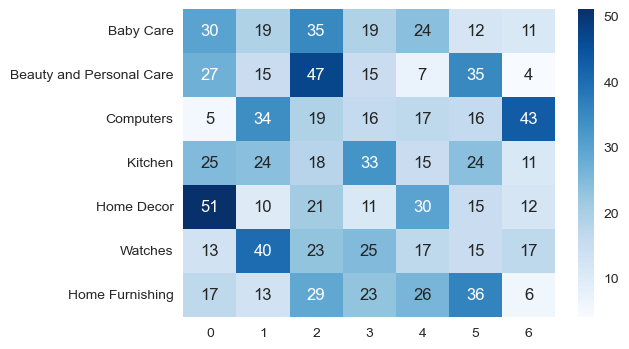

<IPython.core.display.Javascript object>

In [140]:
df_cm_orb = pd.DataFrame(
    conf_mat_orb, index=[label for label in l_cat], columns=[i for i in "0123456"]
)
plt.figure(figsize=(6, 4))
sns.heatmap(df_cm_orb, annot=True, cmap="Blues")

### CNN

- Utilisation du VGG-16 pré-entraîné

- Un réseau de neurones est un système composé de neurones, généralement répartis en plusieurs couches connectées entre elles

Les CNN sont spécialement conçus pour traiter des images en entrée. Leur architecture est alors plus spécifique : elle est composée de deux blocs principaux.

In [141]:
from keras.applications.vgg16 import VGG16
from tensorflow.keras.utils import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import decode_predictions
from keras.layers import Dense
from keras import Model


model = VGG16()  # Création du modèle VGG-16 implementé par Keras

<IPython.core.display.Javascript object>

In [142]:
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

<IPython.core.display.Javascript object>

In [143]:
# image de mug café
img = load_img(
    "/Users/hananemaghlazi/Desktop/Datascientist/Projets_Formation/P6_MAGHLAZI_Hanane/Flipkart/Images/0c70a580d96e50966130e2885d8c3505.jpg",
    target_size=(224, 224),
)  # Charger l'image
img = img_to_array(img)  # Convertir en tableau numpy
img = img.reshape(
    (1, img.shape[0], img.shape[1], img.shape[2])
)  # Créer la collection d'images (un seul échantillon)
img = preprocess_input(img)  # Prétraiter l'image comme le veut VGG-16
y = model.predict(
    img
)  # Prédir la classe de l'image (parmi les 1000 classes d'ImageNet)

1/1 [==============================] - 0s 248ms/step


<IPython.core.display.Javascript object>

In [144]:
img.shape

(1, 224, 224, 3)

<IPython.core.display.Javascript object>

In [145]:
y.shape # On obtient la sortie finale du réseau, c'est-à-dire une liste de 1000 probabilités.

(1, 1000)

<IPython.core.display.Javascript object>

In [146]:
# Afficher les 3 classes les plus probables
print("Top 3 :", decode_predictions(y, top=3)[0])

Top 3 : [('n03063599', 'coffee_mug', 0.7613191), ('n07930864', 'cup', 0.20457745), ('n03950228', 'pitcher', 0.0152707575)]


<IPython.core.display.Javascript object>

### CNN : Transfer Learning :   <a class="anchor" id="cnn"></a>

Le Transfer Learning (ou apprentissage par transfert) permet de faire du Deep Learning sans avoir besoin d'y passer un mois de calculs. Le principe est d'utiliser les connaissances acquises par un réseau de neurones lors de la résolution d'un problème afin d'en résoudre un autre plus ou moins similaire. 

- Pre-Trained Model as Feature Extractor Preprocessor

Stratégie #2 : extraction des features
Le modèle pré-formé peut être utilisé comme un programme autonome pour extraire des caractéristiques de nouvelles images.
Plus précisément, les caractéristiques extraites d'une image peuvent être un vecteur de nombres que le modèle utilisera pour décrire les caractéristiques spécifiques d'une image. Ces caractéristiques peuvent ensuite être utilisées comme données d'entrée dans le développement d'un nouveau modèle.

In [1003]:
from keras.layers import Dense
from keras import Model

# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)


def extract_features(file, model):
    # load the image as a 224x224 array and convert in gray

    img = load_img(path + list_photos[image_cnn], target_size=(224, 224))
    # convert the image pixels to a numpy array
    img = np.array(img)
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

<IPython.core.display.Javascript object>

In [1004]:
model.summary()

Model: "model_70"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_27_input (InputLa  [(None, 224, 224, 3)]    0         
 yer)                                                            
                                                                 
 rescaling_27 (Rescaling)    (None, 224, 224, 3)       0         
                                                                 
 conv2d_114 (Conv2D)         (None, 224, 224, 16)      448       
                                                                 
 max_pooling2d_90 (MaxPoolin  (None, 112, 112, 16)     0         
 g2D)                                                            
                                                                 
 conv2d_115 (Conv2D)         (None, 112, 112, 32)      4640      
                                                                 
 max_pooling2d_91 (MaxPoolin  (None, 56, 56, 32)       0  

<IPython.core.display.Javascript object>

In [148]:
data_cnn = {}
for image_cnn in range(len(list_photos)):
    feat = extract_features(image_cnn, model)
    data_cnn[image_cnn] = feat


# get a list of just the features
feat = np.array(list(data_cnn.values()))
feat.shape

1/1 [==============================] - 0s 111ms/step


(1050, 1, 4096)

<IPython.core.display.Javascript object>

In [149]:
# reshape so that there are 1050 samples of 4096 vectors
feat = feat.reshape(-1, 4096)
feat.shape

(1050, 4096)

<IPython.core.display.Javascript object>

feat

- Réduction de dimension PCA : 

In [150]:
print("Dimensions dataset avant réduction PCA : ", feat.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca_cnn = pca.fit_transform(feat)
print("Dimensions dataset après réduction PCA : ", feat_pca_cnn.shape)

Dimensions dataset avant réduction PCA :  (1050, 4096)
Dimensions dataset après réduction PCA :  (1050, 803)


<IPython.core.display.Javascript object>

Réduction de dimension T-SNE

In [677]:
X_tsne_cnn = tsne.fit_transform(feat_pca_cnn)

df_tsne_cnn = pd.DataFrame(X_tsne_cnn[:, 0:2], columns=["tsne1", "tsne2"])
df_tsne_cnn["class"] = data["label_name"]
print(df_tsne_cnn.shape)

(1050, 3)


<IPython.core.display.Javascript object>

- Analyse visuelle : affichage T-SNE selon catégories d'images

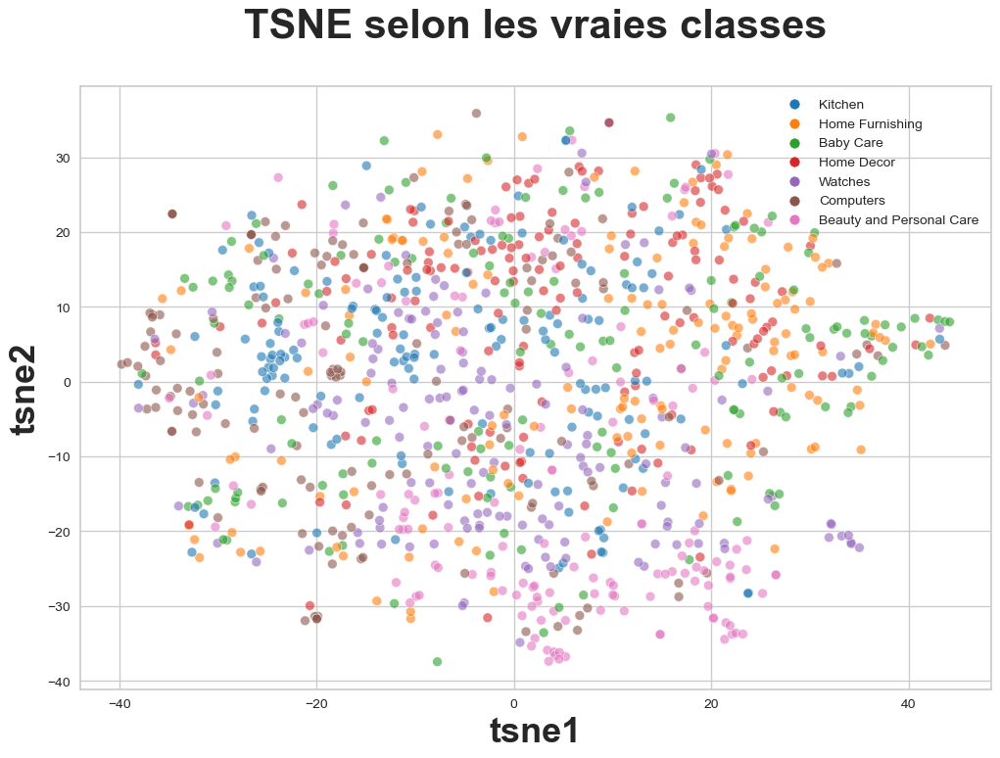

<IPython.core.display.Javascript object>

In [182]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x="tsne1",
    y="tsne2",
    hue="class",
    data=df_tsne_cnn,
    legend="brief",
    palette=sns.color_palette("tab10", n_colors=7),
    s=50,
    alpha=0.6,
)

plt.title("TSNE selon les vraies classes", fontsize=30, pad=35, fontweight="bold")
plt.xlabel("tsne1", fontsize=26, fontweight="bold")
plt.ylabel("tsne2", fontsize=26, fontweight="bold")
plt.legend(loc="best")

plt.show()

In [680]:
df_tsne_cnn

,tsne1,tsne2,class
0,10.4899,-1.9697,Kitchen
1,-24.7038,-27.0104,Home Furnishing
2,-15.6362,-14.0340,Baby Care
3,9.5387,-24.5250,Home Decor
4,38.4036,-1.8096,Watches
...,...,...,...
1045,-15.1568,-24.5823,Baby Care
1046,-4.0387,-2.7365,Home Decor
1047,15.7516,-17.3682,Home Decor
1048,-18.4221,-2.5713,Home Furnishing


<IPython.core.display.Javascript object>

Création de clusters à partir du T-SNE

In [681]:
cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne_cnn)

df_tsne_cnn["cluster"] = cls.labels_
print(df_tsne_cnn.shape)

(1050, 4)


<IPython.core.display.Javascript object>

- Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters

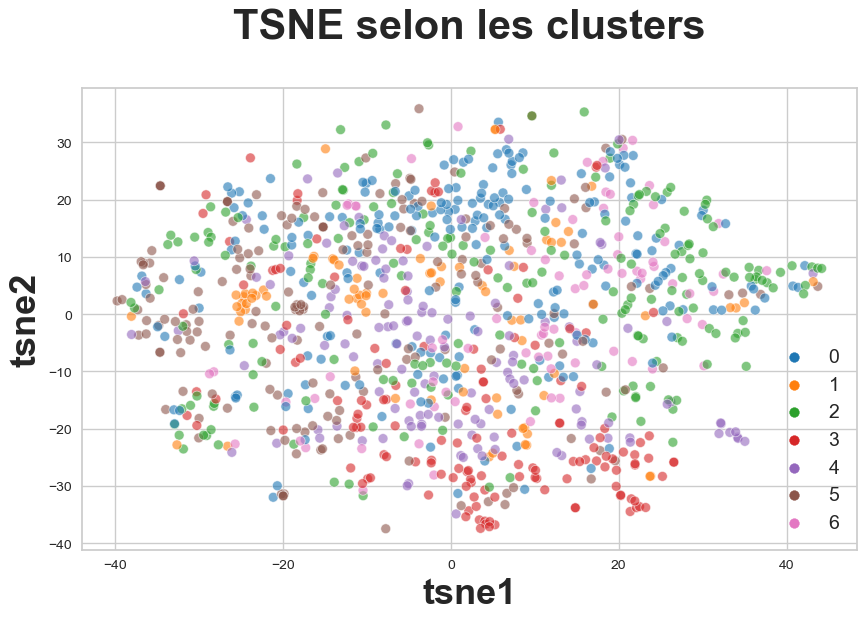

ARI :  0.474


<IPython.core.display.Javascript object>

In [155]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x="tsne1",
    y="tsne2",
    hue="cluster",
    palette=sns.color_palette("tab10", n_colors=7),
    s=50,
    alpha=0.6,
    data=df_tsne_cnn,
    legend="brief",
)

plt.title("TSNE selon les clusters", fontsize=30, pad=35, fontweight="bold")
plt.xlabel("tsne1", fontsize=26, fontweight="bold")
plt.ylabel("tsne2", fontsize=26, fontweight="bold")
plt.legend(prop={"size": 14})

plt.show()

labels = data["label"]
print("ARI : ", np.round(metrics.adjusted_rand_score(labels, cls.labels_), 3))

- Analyse par classes : 

In [156]:
df_tsne_cnn.groupby("cluster").count()["class"]

cluster
0    220
1     80
2    205
3    145
4    138
5    182
6     80
Name: class, dtype: int64

<IPython.core.display.Javascript object>

In [157]:
conf_mat_cnn = metrics.confusion_matrix(labels, cls.labels_)
print(conf_mat_cnn)

[[ 23   1 111   5   0   2   8]
 [ 12   1   8 118   1   9   1]
 [ 35   0   1   2   0 112   0]
 [124   0  10   1   4  10   1]
 [  5   0  74   0   0   1  70]
 [ 19  78   1  19   0  33   0]
 [  2   0   0   0 133  15   0]]


<IPython.core.display.Javascript object>

<AxesSubplot:>

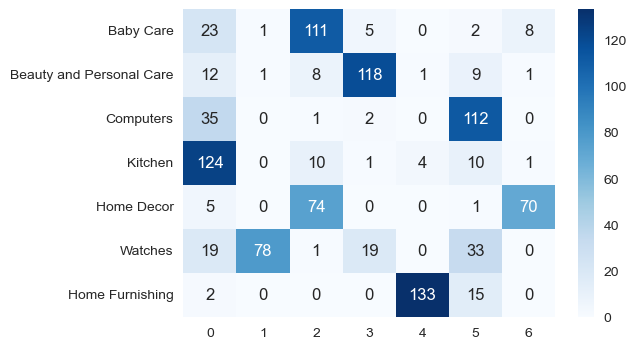

<IPython.core.display.Javascript object>

In [164]:
df_cm_cnn = pd.DataFrame(
    conf_mat_cnn, index=[label for label in l_cat], columns=[i for i in "0123456"]
)
plt.figure(figsize=(6, 4))
sns.heatmap(df_cm_cnn, annot=True, fmt=".3g", cmap="Blues")

### Approche supervisée :  <a class="anchor" id="super"></a>

Stratégie #1 : fine-tuning partiel
Pre-Trained Model as Classifier
on remplace à nouveau la dernière couche fully-connected par le nouveau classifieur initialisé aléatoirement, et on fixe les paramètres de certaines couches du réseau pré-entraîné. Ainsi, en plus du classifieur, on entraîne sur les nouvelles images les couches non-fixées, qui correspondent en général aux plus hautes du réseau. 

In [522]:
data.head(100)

,image_file,label_name,label
0,aa68675f50a0551b8dadb954017a50a1.jpg,Kitchen,5
1,037c2402fee39fbc80433935711d1383.jpg,Home Furnishing,4
2,42643c1c9403f67921a18654bcf45ead.jpg,Baby Care,0
3,53f4bc7d7321f5c41de6b86e41f13e80.jpg,Home Decor,3
4,b144a363c107c7bdd91f32d6e28ba6f2.jpg,Watches,6
5,db3e2eeb4fe90d4755f2911d661eae95.jpg,Home Furnishing,4
6,9a9402ad55d079c86c302521816b7b0e.jpg,Computers,2
7,42a8fef62716772c391fbdd148cc9c16.jpg,Beauty and Personal Care,1
8,503bb08f7bdf6a395ec564dd1dc83619.jpg,Kitchen,5
9,42770faa04bfcf2b62e7ef335e1b1965.jpg,Home Decor,3


<IPython.core.display.Javascript object>

In [519]:
# extraire que le fichier avec les labels
data_cnn = data[["image_file", "label"]]

data_cnn = data_cnn.to_csv(
    "/Users/hananemaghlazi/Desktop/Datascientist/Projets_Formation/P6_MAGHLAZI_Hanane/Flipkart/data_cnn.csv",
    index=False,
)
# to csv

<IPython.core.display.Javascript object>

Créer les dossiers de chaque catégorie de groupe

In [566]:
# 0. baby care, 1 beauty and personnal care,2 computers,3 home decore, 4 home furnishing,5 kitchen,6 watches
labels = pd.read_csv(
    r"/Users/hananemaghlazi/Desktop/Datascientist/Projets_Formation/P6_MAGHLAZI_Hanane/Flipkart/data_cnn.csv"
)
train_dir = r"/Users/hananemaghlazi/Desktop/Datascientist/Projets_Formation/P6_MAGHLAZI_Hanane/Flipkart/Images/"
DR = r"/Users/hananemaghlazi/Desktop/Datascientist/Projets_Formation/P6_MAGHLAZI_Hanane/Flipkart/Images/cnn"
if not os.path.exists(DR):
    os.mkdir(DR)

for filename, class_name in labels.values:
    # Create subdirectory with `class_name`
    if not os.path.exists(DR + str(class_name)):
        os.mkdir(DR + str(class_name))
    src_path = train_dir + "/" + filename + ".jpg"
    dst_path = DR + str(class_name) + "/" + filename + ".jpg"
    try:
        shutil.copy(src_path, dst_path)
        print("sucessful")
    except IOError as e:
        print("Unable to copy file {} to {}".format(src_path, dst_path))
    except:
        print(
            "When try copy file {} to {}, unexpected error: {}".format(
                src_path, dst_path, sys.exc_info()
            )
        )

sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful
sucessful


<IPython.core.display.Javascript object>

In [578]:
data_dir = pathlib.Path(path2)
print(data_dir)

/Users/hananemaghlazi/Desktop/Datascientist/Projets_Formation/P6_MAGHLAZI_Hanane/Flipkart/Images/cnn


<IPython.core.display.Javascript object>

Utiliser des utilitaires de prétraitement Keras de haut niveau (tels que tf.keras.utils.image_dataset_from_directory ) et des couches (telles que tf.keras.layers.Rescaling ) pour lire un répertoire d'images sur le disque.


In [575]:
# vérification du nombre total des images dans le dossier cnn
image_count = len(list(data_dir.glob("*/*.jpg")))
print(image_count)

1050


<IPython.core.display.Javascript object>

In [ ]:
import PIL
import PIL.Image

watches = list(data_dir.glob("Watches/*"))
PIL.Image.open(str(watches[1]))

Charger des données à l'aide d'un utilitaire Keras
- Une division de validation lors du développement de votre modèle. 80% des images pour l'entrainement et 20% pour la validation.

In [928]:
batch_size = 32
img_height = 180
img_width = 180

<IPython.core.display.Javascript object>

In [929]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size,
)

Found 1050 files belonging to 7 classes.
Using 840 files for training.


<IPython.core.display.Javascript object>

In [930]:
val_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size,
)

Found 1050 files belonging to 7 classes.
Using 210 files for validation.


<IPython.core.display.Javascript object>

les noms de classe dans l'attribut class_names sur ces ensembles de données.

In [931]:
class_names = train_ds.class_names
print(class_names)

['Baby Care', 'Beauty and Personal Care', 'Computers', 'Home Decor', 'Home Furnishing', 'kitchen', 'watches']


<IPython.core.display.Javascript object>

Visualisez les données

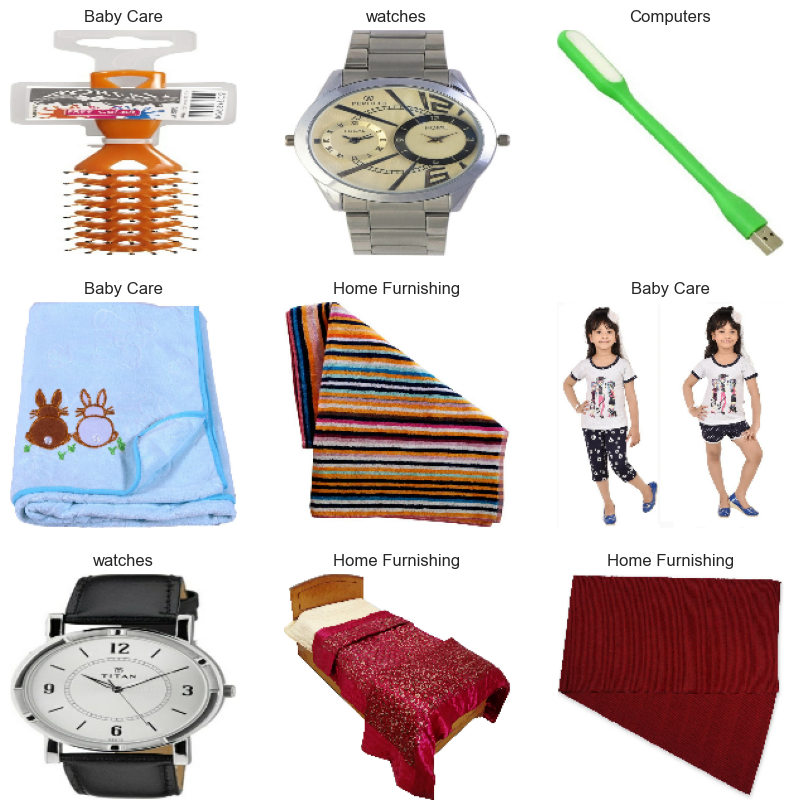

<IPython.core.display.Javascript object>

In [932]:
# Voici les neuf premières images de l'ensemble de données d'entraînement.

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [933]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

(32, 180, 180, 3)
(32,)


<IPython.core.display.Javascript object>

L' image_batch est un tenseur de la forme (32, 180, 180, 3) . Il s'agit d'un lot de 32 images de forme 180x180x3 (la dernière dimension fait référence aux canaux de couleur RVB). Le label_batch est un tenseur de la forme (32,) , ce sont des labels correspondants aux 32 images.

Standardiser les données
Les valeurs des canaux RVB sont dans la plage [0, 255] . Ce n'est pas idéal pour un réseau neuronal ; en général, on cherche chercher à rendre vos valeurs d'entrée petites.

Inormaliser les valeurs pour qu'elles soient dans la plage [0, 1] en utilisant tf.keras.layers.Rescaling 

In [934]:
# Normalisation
normalization_layer = tf.keras.layers.Rescaling(1.0 / 255)
normalization_layer

<IPython.core.display.Javascript object>

In [935]:
#  on va inclure la couche dans la définition de votre modèle pour simplifier le déploiement.
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


<IPython.core.display.Javascript object>

Configurer l'ensemble de données pour les performances
utiliser la prélecture tamponnée afin de récupérer des données à partir du disque sans que les E/S ne deviennent bloquantes.

Dataset.cache conserve les images en mémoire après leur chargement hors disque au cours de la première époque. Cela garantira que l'ensemble de données ne devienne pas un goulot d'étranglement lors de la formation de votre modèle. Si votre jeu de données est trop volumineux pour tenir en mémoire, vous pouvez également utiliser cette méthode pour créer un cache sur disque performant.
Dataset.prefetch chevauche le prétraitement des données et l'exécution du modèle pendant la formation.


In [936]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

<IPython.core.display.Javascript object>

Création du modèle

Le modèle séquentiel se compose de trois blocs de convolution ( tf.keras.layers.Conv2D ) avec une couche de regroupement maximum ( tf.keras.layers.MaxPooling2D ) dans chacun d'eux. Il y a une couche entièrement connectée ( tf.keras.layers.Dense ) avec 128 unités dessus qui est activée par une fonction d'activation ReLU ( 'relu' ). Ce modèle n'a pas été réglé pour une grande précision. 

In [999]:
num_classes = len(class_names)

model = Sequential(
    [
        tf.keras.layers.Rescaling(1.0 / 255, input_shape=(img_height, img_width, 3)),
        tf.keras.layers.Conv2D(16, 3, padding="same", activation="relu"),
        tf.keras.layers.MaxPooling2D(),
        tf.keras.layers.Conv2D(32, 3, padding="same", activation="relu"),
        tf.keras.layers.MaxPooling2D(),
        tf.keras.layers.Conv2D(64, 3, padding="same", activation="relu"),
        tf.keras.layers.MaxPooling2D(),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation="relu"),
        tf.keras.layers.Dense(num_classes),
    ]
)

<IPython.core.display.Javascript object>

Compiler le modèle
choix de  l'optimiseur tf.keras.optimizers.Adam et la fonction de perte tf.keras.losses.SparseCategoricalCrossentropy .

In [1001]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


<IPython.core.display.Javascript object>

In [1002]:
model.summary()

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_27 (Rescaling)    (None, 224, 224, 3)       0         
                                                                 
 conv2d_114 (Conv2D)         (None, 224, 224, 16)      448       
                                                                 
 max_pooling2d_90 (MaxPoolin  (None, 112, 112, 16)     0         
 g2D)                                                            
                                                                 
 conv2d_115 (Conv2D)         (None, 112, 112, 32)      4640      
                                                                 
 max_pooling2d_91 (MaxPoolin  (None, 56, 56, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_116 (Conv2D)         (None, 56, 56, 64)      

<IPython.core.display.Javascript object>

Former le modèle

In [939]:
epochs = 10
history = model.fit(train_ds, validation_data=val_ds, epochs=epochs)

Epoch 1/10
27/27 [==============================] - 11s 327ms/step - loss: 2.2273 - accuracy: 0.1988 - val_loss: 1.8528 - val_accuracy: 0.2429
Epoch 2/10
27/27 [==============================] - 7s 273ms/step - loss: 1.5626 - accuracy: 0.4429 - val_loss: 1.5716 - val_accuracy: 0.4048
Epoch 3/10
27/27 [==============================] - 7s 270ms/step - loss: 1.1324 - accuracy: 0.6167 - val_loss: 1.4773 - val_accuracy: 0.4810
Epoch 4/10
27/27 [==============================] - 7s 275ms/step - loss: 0.8368 - accuracy: 0.7071 - val_loss: 1.3311 - val_accuracy: 0.5095
Epoch 5/10
27/27 [==============================] - 8s 282ms/step - loss: 0.5433 - accuracy: 0.8321 - val_loss: 1.5241 - val_accuracy: 0.5143
Epoch 6/10
27/27 [==============================] - 7s 275ms/step - loss: 0.4472 - accuracy: 0.8536 - val_loss: 1.9578 - val_accuracy: 0.4571
Epoch 7/10
27/27 [==============================] - 8s 281ms/step - loss: 0.3076 - accuracy: 0.9060 - val_loss: 1.9432 - val_accuracy: 0.4810
Epoch

<IPython.core.display.Javascript object>

Visualisez les résultats de l'entraînement

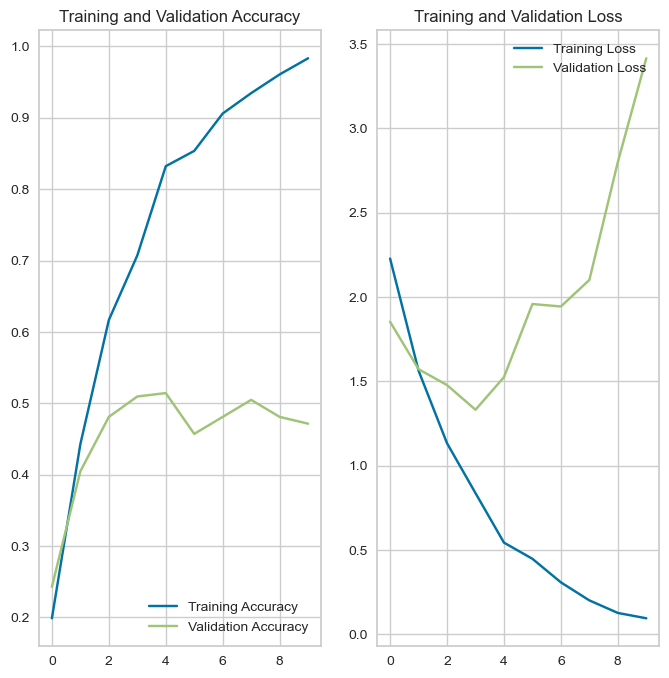

<IPython.core.display.Javascript object>

In [940]:
acc = history.history["accuracy"]
val_acc = history.history["val_accuracy"]

loss = history.history["loss"]
val_loss = history.history["val_loss"]

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label="Training Accuracy")
plt.plot(epochs_range, val_acc, label="Validation Accuracy")
plt.legend(loc="lower right")
plt.title("Training and Validation Accuracy")

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label="Training Loss")
plt.plot(epochs_range, val_loss, label="Validation Loss")
plt.legend(loc="upper right")
plt.title("Training and Validation Loss")
plt.show()

Augmentation des données

Le surajustement se produit généralement lorsqu'il y a un petit nombre d'exemples de formation. L'augmentation des données consiste à générer des données d'entraînement supplémentaires à partir de vos exemples existants en les augmentant à l'aide de transformations aléatoires qui produisent des images d'apparence crédible. Cela permet d'exposer le modèle à davantage d'aspects des données et de mieux généraliser.

In [941]:
data_augmentation = Sequential(
    [
        tf.keras.layers.RandomFlip(
            "horizontal", input_shape=(img_height, img_width, 3)
        ),
        tf.keras.layers.RandomRotation(0.1),
        tf.keras.layers.RandomZoom(0.1),
    ]
)

<IPython.core.display.Javascript object>

In [1005]:
model = Sequential(
    [
        data_augmentation,
        tf.keras.layers.Rescaling(1.0 / 255),
        tf.keras.layers.Conv2D(16, 3, padding="same", activation="relu"),
        tf.keras.layers.MaxPooling2D(),
        tf.keras.layers.Conv2D(32, 3, padding="same", activation="relu"),
        tf.keras.layers.MaxPooling2D(),
        tf.keras.layers.Conv2D(64, 3, padding="same", activation="relu"),
        tf.keras.layers.MaxPooling2D(),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation="relu"),
        tf.keras.layers.Dense(num_classes),
    ]
)

<IPython.core.display.Javascript object>

In [1006]:
model.compile(
    optimizer="adam",
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=["accuracy"],
)

<IPython.core.display.Javascript object>

In [1007]:
model.summary()

Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_28 (Sequential)  (None, 180, 180, 3)       0         
                                                                 
 rescaling_28 (Rescaling)    (None, 180, 180, 3)       0         
                                                                 
 conv2d_117 (Conv2D)         (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_93 (MaxPoolin  (None, 90, 90, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_118 (Conv2D)         (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_94 (MaxPoolin  (None, 45, 45, 32)       0         
 g2D)                                                

<IPython.core.display.Javascript object>

In [946]:
epochs = 15
history = model.fit(train_ds, validation_data=val_ds, epochs=epochs)

Epoch 1/15
27/27 [==============================] - 12s 355ms/step - loss: 2.0528 - accuracy: 0.1571 - val_loss: 1.9464 - val_accuracy: 0.1238
Epoch 2/15
27/27 [==============================] - 9s 348ms/step - loss: 1.8937 - accuracy: 0.1976 - val_loss: 1.8208 - val_accuracy: 0.2524
Epoch 3/15
27/27 [==============================] - 9s 352ms/step - loss: 1.7704 - accuracy: 0.2976 - val_loss: 1.6072 - val_accuracy: 0.4381
Epoch 4/15
27/27 [==============================] - 9s 343ms/step - loss: 1.6318 - accuracy: 0.3905 - val_loss: 1.5034 - val_accuracy: 0.4667
Epoch 5/15
27/27 [==============================] - 9s 348ms/step - loss: 1.5316 - accuracy: 0.4226 - val_loss: 1.6223 - val_accuracy: 0.3857
Epoch 6/15
27/27 [==============================] - 9s 349ms/step - loss: 1.4010 - accuracy: 0.4857 - val_loss: 1.4574 - val_accuracy: 0.4667
Epoch 7/15
27/27 [==============================] - 9s 349ms/step - loss: 1.3036 - accuracy: 0.5321 - val_loss: 1.4315 - val_accuracy: 0.4571
Epoch

<IPython.core.display.Javascript object>

VGG16 :

In [976]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(224, 224),
    batch_size=32,
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(224, 224),
    batch_size=32,
)

Found 1050 files belonging to 7 classes.
Using 840 files for training.
Found 1050 files belonging to 7 classes.
Using 210 files for validation.


<IPython.core.display.Javascript object>

In [980]:
NBCLASSES = 7


def create_model():
    vgg = VGG16(input_shape=(224, 224, 3), weights="imagenet", include_top=False)

    # Freeze existing VGG already trained weights
    # On entraîne seulement le nouveau classifieur et on ne ré-entraîne pas les autres couches :
    for layer in vgg.layers:
        layer.trainable = False

    # get the VGG output
    out = vgg.output

    # Add new dense layer at the end
    x = Flatten()(out)
    x = Dense(NBCLASSES, activation="softmax")(x)

    model = Model(inputs=vgg.input, outputs=x)

    model.compile(
        loss="SparseCategoricalCrossentropy",
        optimizer="adam",
        metrics=["accuracy"],
    )

    model.summary()

    return model


mymodel = create_model()

Model: "model_69"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_85 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0  

<IPython.core.display.Javascript object>

In [978]:
epochs = 6
hist = mymodel.fit(train_ds, validation_data=val_ds, epochs=epochs)# sgd

Epoch 1/6
27/27 [==============================] - 75s 3s/step - loss: 17.2262 - accuracy: 0.6440 - val_loss: 14.9812 - val_accuracy: 0.7286
Epoch 2/6
27/27 [==============================] - 80s 3s/step - loss: 5.0881 - accuracy: 0.8905 - val_loss: 13.6757 - val_accuracy: 0.7667
Epoch 3/6
27/27 [==============================] - 84s 3s/step - loss: 2.8491 - accuracy: 0.9524 - val_loss: 15.2877 - val_accuracy: 0.7667
Epoch 4/6
27/27 [==============================] - 87s 3s/step - loss: 0.5541 - accuracy: 0.9786 - val_loss: 17.9909 - val_accuracy: 0.8000
Epoch 5/6
27/27 [==============================] - 87s 3s/step - loss: 0.2419 - accuracy: 0.9893 - val_loss: 15.6027 - val_accuracy: 0.7857
Epoch 6/6
27/27 [==============================] - 90s 3s/step - loss: 0.0278 - accuracy: 0.9988 - val_loss: 16.9030 - val_accuracy: 0.7857


<IPython.core.display.Javascript object>

In [981]:
epochs = 6
hist = mymodel.fit(train_ds, validation_data=val_ds, epochs=epochs)  # adam

Epoch 1/6
27/27 [==============================] - 75s 3s/step - loss: 16.5653 - accuracy: 0.6571 - val_loss: 10.7715 - val_accuracy: 0.7905
Epoch 2/6
27/27 [==============================] - 87s 3s/step - loss: 1.7778 - accuracy: 0.9417 - val_loss: 12.2238 - val_accuracy: 0.8048
Epoch 3/6
27/27 [==============================] - 88s 3s/step - loss: 0.3247 - accuracy: 0.9833 - val_loss: 11.3444 - val_accuracy: 0.8000
Epoch 4/6
27/27 [==============================] - 89s 3s/step - loss: 0.1335 - accuracy: 0.9881 - val_loss: 11.5655 - val_accuracy: 0.8238
Epoch 5/6
27/27 [==============================] - 89s 3s/step - loss: 0.0135 - accuracy: 0.9976 - val_loss: 12.5248 - val_accuracy: 0.8143
Epoch 6/6
27/27 [==============================] - 89s 3s/step - loss: 0.0061 - accuracy: 0.9988 - val_loss: 10.8074 - val_accuracy: 0.8095


<IPython.core.display.Javascript object>

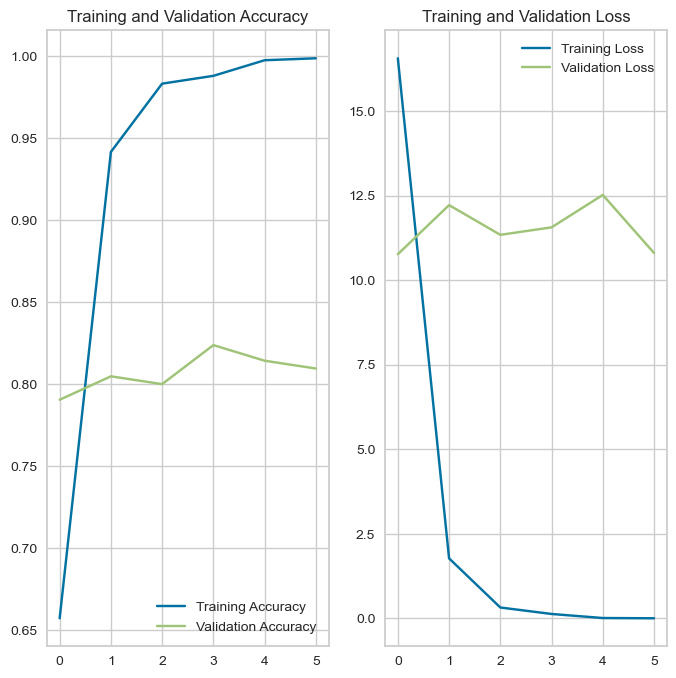

<IPython.core.display.Javascript object>

In [982]:
acc = hist.history["accuracy"]
val_acc = hist.history["val_accuracy"]

loss = hist.history["loss"]
val_loss = hist.history["val_loss"]

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label="Training Accuracy")
plt.plot(epochs_range, val_acc, label="Validation Accuracy")
plt.legend(loc="lower right")
plt.title("Training and Validation Accuracy")

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label="Training Loss")
plt.plot(epochs_range, val_loss, label="Validation Loss")
plt.legend(loc="upper right")
plt.title("Training and Validation Loss")
plt.show()

### Combinaison des features textes et images :  <a class="anchor" id="comb"></a>

donnes tsne de use et cnn : ( acp+tsne)

In [851]:
labels = data["label"]

<IPython.core.display.Javascript object>

In [659]:
X_tsne_use.shape

(1050, 2)

<IPython.core.display.Javascript object>

In [660]:
X_tsne_cnn.shape

(1050, 2)

<IPython.core.display.Javascript object>

In [842]:
df_tsne_use = pd.DataFrame(X_tsne_use, columns=["tsne3", "tsn4"])
df_use_cnn = pd.concat([df_tsne_use, df_tsne_cnn], axis=1)

df_use_cnn

,tsne3,tsn4,tsne1,tsne2,class,cluster
0,37.2070,-10.2975,10.4899,-1.9697,Kitchen,0
1,32.1014,2.9483,-24.7038,-27.0104,Home Furnishing,2
2,32.2679,3.3637,-15.6362,-14.0340,Baby Care,2
3,33.2197,-2.8957,9.5387,-24.5250,Home Decor,0
4,33.7006,-2.6959,38.4036,-1.8096,Watches,4
...,...,...,...,...,...,...
1045,18.8039,12.4886,-15.1568,-24.5823,Baby Care,2
1046,17.9455,12.3096,-4.0387,-2.7365,Home Decor,0
1047,-13.1367,-4.7768,15.7516,-17.3682,Home Decor,0
1048,-11.2005,-4.6251,-18.4221,-2.5713,Home Furnishing,2


<IPython.core.display.Javascript object>

In [844]:
df_use_cnn.iloc[:, 0:4]

,tsne3,tsn4,tsne1,tsne2
0,37.2070,-10.2975,10.4899,-1.9697
1,32.1014,2.9483,-24.7038,-27.0104
2,32.2679,3.3637,-15.6362,-14.0340
3,33.2197,-2.8957,9.5387,-24.5250
4,33.7006,-2.6959,38.4036,-1.8096
...,...,...,...,...
1045,18.8039,12.4886,-15.1568,-24.5823
1046,17.9455,12.3096,-4.0387,-2.7365
1047,-13.1367,-4.7768,15.7516,-17.3682
1048,-11.2005,-4.6251,-18.4221,-2.5713


<IPython.core.display.Javascript object>

In [853]:
cls = cluster.KMeans(n_clusters=7, n_init=100, random_state=42)
cls.fit(df_use_cnn.iloc[:, 0:4])
ARI = np.round(metrics.adjusted_rand_score(y_cat_num, cls.labels_), 4)
print("ARI : ", ARI)

ARI :  0.2496


<IPython.core.display.Javascript object>

données tsne de use et cnn : (use : tsne, cnn : acp)

In [858]:
df_pca_cnn = pd.DataFrame(feat_pca_cnn)
df_use_cnn2 = pd.concat([df_tsne_use, df_pca_cnn], axis=1)
df_use_cnn2

,tsne3,tsn4,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,...,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802
0,37.2070,-10.2975,-2.6957,5.1443,0.4704,6.9801,1.1100,15.1637,-1.8237,-2.3760,6.9079,5.3975,-0.5426,-2.9344,8.2424,7.1673,-8.7625,1.6409,-7.6477,-5.3978,-4.5510,-12.7165,-2.3822,-18.8345,0.8519,0.1551,-7.0602,-5.7094,-3.1075,1.2790,-10.4036,-1.5488,-9.0950,-8.5031,16.7970,0.8255,0.6425,12.8697,-6.5535,3.3128,1.0843,2.3938,-4.6646,0.0927,2.6445,-0.7703,-0.2154,-3.5035,-1.0285,-8.1427,7.7027,1.4118,-3.1392,-0.8822,0.2481,9.0702,13.6629,-11.0678,-12.9720,-6.6349,1.3782,-11.0567,-0.3911,2.0591,-7.9156,1.2908,-4.7465,7.1415,7.0961,0.9253,2.4012,-8.3870,-1.1892,3.7017,-11.3014,-6.7530,-2.5271,3.4789,8.3731,0.0029,1.6680,-1.8958,1.8926,0.3845,1.4555,-5.1971,-1.5283,-1.1808,5.6118,-5.2854,-1.7720,9.0896,3.4924,-2.1590,-2.7293,-9.0766,2.8688,8.1979,-0.7703,2.0652,...,-0.0425,0.1524,0.3455,0.1688,-0.0572,0.5478,-0.1121,-0.3656,0.4262,0.1327,0.2614,-0.1088,-0.4809,-0.5903,-0.3547,-0.3115,-0.4837,0.4656,-0.0323,0.3573,-0.4766,0.2884,0.0164,-0.1603,0.0042,0.0725,-0.0805,-0.3779,-0.1827,0.2867,-0.1339,-0.3341,-0.0967,-0.1707,0.3794,-0.1256,0.2466,-0.2921,0.2788,0.3972,-0.0037,-0.0202,0.2441,-0.4268,0.1535,-0.3535,0.0307,-0.0658,0.1349,-0.7206,0.1811,0.0562,0.4699,-0.3010,0.1265,-0.2667,0.0544,-0.3403,0.2675,0.3438,-0.2207,-0.1059,-0.0116,-0.0645,-0.0795,0.2304,-0.0538,-0.2106,-0.1162,-0.3143,-0.0642,-0.1787,0.3875,-0.1013,0.1648,-0.2433,0.0704,-0.2953,0.3470,0.1496,0.8255,0.6539,-0.2667,0.1482,-0.4158,0.3746,-0.0793,-0.1078,-0.3986,-0.2696,0.4952,0.3285,0.3765,0.0413,0.3726,-0.2735,-0.1077,0.0881,-0.0292,0.2721
1,32.1014,2.9483,-15.1070,28.4585,8.0819,-18.8899,11.4502,-1.8359,3.7778,-10.4107,-11.3088,11.3459,20.2127,-7.1886,-9.4070,-12.5102,-2.6157,3.4677,-17.4716,4.2623,-0.3431,0.8447,6.3061,9.5345,-1.2805,17.7155,-3.9903,18.0355,-7.0297,3.7924,-1.2013,10.0914,10.1104,-1.3711,9.5835,3.3985,-10.4809,0.0345,3.0451,-8.9018,-1.3834,-0.3387,-8.0026,-4.8840,0.9234,-3.1588,-10.3096,1.5865,5.8807,6.3742,-2.8529,-0.3575,1.6615,5.0398,0.9464,-0.4597,-7.9145,3.0556,7.3087,-3.2974,1.5685,5.5589,-1.8252,3.7487,4.9841,1.4973,4.8464,-6.0519,-0.0450,5.7979,0.8485,3.4731,2.8109,-2.7919,-0.9656,-8.6922,-1.7309,-3.9503,-0.0259,2.6438,-7.4850,0.6250,-7.4730,-4.4095,0.9806,0.6468,9.2706,1.0538,0.8812,1.5417,-3.4417,-8.2158,4.1511,-6.3994,1.2835,-8.4769,-1.2524,-3.3667,-6.7784,5.5398,...,-1.3967,-0.1516,0.0744,-0.6551,-0.2120,-0.1451,-0.2580,-0.2905,0.2638,0.0200,-0.9681,0.2911,-0.8551,0.0405,0.4432,-0.8593,-0.0949,0.8008,-0.0093,-0.4724,-1.3132,0.0960,-0.4092,0.6617,-0.1467,1.4814,-0.9421,-0.0349,-0.7739,0.5657,-0.0739,-0.5476,-0.5207,-1.3546,0.3369,0.2944,-0.4456,0.4884,0.0417,-0.9150,0.5028,-0.6961,0.3664,0.4042,0.0782,0.3869,-0.1930,-0.1620,-0.4935,0.7268,-0.5693,0.1643,0.3004,0.4088,0.4303,0.4466,0.6579,-0.2085,-0.3011,-0.4980,0.2928,-0.6689,-0.5400,-0.1744,0.4337,0.3028,0.5206,-0.7592,0.1621,0.0789,-0.5315,-0.3407,0.7792,0.6157,1.2862,0.0682,-0.3499,0.2615,0.2208,-0.2005,0.1470,0.2070,-0.4085,0.5612,1.0754,-0.1930,-0.0709,-0.1041,0.6188,0.5604,0.4183,-0.5630,0.0384,-0.2736,0.0280,0.3421,-0.7038,-0.2721,-0.6424,0.1527
2,32.2679,3.3637,1.2265,29.5245,-9.6866,-3.5072,-15.0989,-22.7150,-3.0045,4.2194,9.9882,-10.5682,-11.3543,-0.5820,-4.3968,9.1382,16.7387,-1.1853,8.5713,-1.6356,17.2782,12.3575,15.1694,-9.3369,-8.9586,-0.2324,-6.6843,-7.3077,13.5900,0.0459,-3.3603,4.9919,-

<IPython.core.display.Javascript object>

In [861]:
cls = cluster.KMeans(n_clusters=7, n_init=100, random_state=42)
cls.fit(df_use_cnn2)
ARI = np.round(metrics.adjusted_rand_score(labels, cls.labels_), 4)
print("ARI : ", ARI)

ARI :  0.1743


<IPython.core.display.Javascript object>

sans réduction :  features_tfidf(matrice),cnn

In [865]:
df3 = pd.DataFrame(feat)  # convert feat cnn to dataframe
df3.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,...,3996,3997,3998,3999,4000,4001,4002,4003,4004,4005,4006,4007,4008,4009,4010,4011,4012,4013,4014,4015,4016,4017,4018,4019,4020,4021,4022,4023,4024,4025,4026,4027,4028,4029,4030,4031,4032,4033,4034,4035,4036,4037,4038,4039,4040,4041,4042,4043,4044,4045,4046,4047,4048,4049,4050,4051,4052,4053,4054,4055,4056,4057,4058,4059,4060,4061,4062,4063,4064,4065,4066,4067,4068,4069,4070,4071,4072,4073,4074,4075,4076,4077,4078,4079,4080,4081,4082,4083,4084,4085,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,0.0000,0.0000,0.0000,0.6807,0.4055,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.5206,0.0000,0.0000,0.0000,5.5593,0.7313,2.3956,0.0000,0.0000,0.0000,5.1938,0.0000,0.6245,0.0000,0.0000,0.0000,0.0000,0.0000,2.0020,0.0000,0.0000,0.0000,0.9042,0.0000,0.0000,0.3547,0.0000,3.1478,3.5892,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.6048,0.0000,0.0000,0.8522,0.0000,1.0279,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.7255,0.0734,1.4585,0.0000,0.0000,0.0000,0.0000,0.0000,4.3983,0.0000,1.9242,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.2877,0.0000,0.0000,4.2725,0.0000,2.8228,0.0000,0.0000,0.8301,0.9051,0.0000,0.0000,0.8291,0.1243,0.0000,0.7721,...,0.0000,3.3075,0.0000,0.0000,2.5592,0.0000,0.0000,1.6238,0.0000,0.0162,0.0000,2.0856,1.4712,0.0000,1.2436,0.0000,0.0000,0.0000,0.0000,5.1811,0.8827,1.5226,1.0201,0.0000,3.3816,0.0000,0.0000,1.4866,0.0000,0.0000,0.0000,3.1258,2.0763,0.6725,0.0000,0.0000,0.0000,0.0000,0.0000,3.1364,0.0000,3.0507,0.0000,1.8760,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1401,0.5517,0.0000,0.5904,0.1043,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.4782,0.0000,2.5095,3.1515,0.4916,0.0000,1.1459,0.0000,4.7256,0.8783,0.0000,0.0000,0.0000,3.0374,0.0000,0.0000,0.0000,0.0000,0.0000,1.0963,0.0000,1.9842,0.0000,0.0000,0.0000,0.8132,0.2190,0.0000,3.1414,0.0560,0.0000,0.0000,2.3963,0.0000,0.6283,6.9593,0.0000,0.6634
1,0.0000,0.0000,0.0000,0.0000,0.0000,0.9370,2.4795,0.0000,0.0000,2.7656,0.0000,0.0000,0.8157,0.0000,0.5217,0.0000,0.0000,0.1080,0.0000,2.7749,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,2.3392,0.8421,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.9731,0.0000,0.0000,0.0000,3.0675,0.0000,4.7011,0.0000,0.0000,0.0000,5.1015,0.0000,0.0000,0.0000,0.0000,2.5743,0.0000,0.2459,2.2152,4.4091,0.0000,2.0356,0.0000,1.4206,0.0000,0.0000,0.0000,0.0000,0.0000,0.2188,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.3345,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,6.9029,0.0000,4.5610,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,1.3987,0.0000,0.8346,0.1582,0.0000,6.1514,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.6612,0.2437,0.0000,10.1725,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,6.0359,0.9919,0.0000,0.0000,0.0000,0.0000,0.0000,3.2567,0.0000,0.6472,0.6727,0.0000,0.0000,1.3888,0.1261,0.0000,0.0000,0.0000,0.0000,0.0000,3.4177,0.0000,0.0029,0.0000,0.0000,0.0000,0.0000,8.6300,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.5440,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0558,0.0000,0.0000,0.0000,0.0000,0.0000,1.9006,0.0000,0.0000,0.0000,0.0000,0.0000,0.1937,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.9896,3.5109,5.8121,0.0000,0.0000,4.6162,0.0000,0.0000,0.0000,0.0000,2.2736,1.4186,0.0000,0.0000,0.0000
2,0.0000,0.0000,0.0000,3.4774,0.0000,0.7770,0.0000,0.3943,0.0000,5.2269,0.0000,0.0000,1.7976,0.0000,0.0000,0.0000,1.8448,3.2874,0.0000,1.6670,0.0000,0.0000,0.0000,3.1290,0.4406,0.0000,0.0000,2.2166,0.0000,0.2931,1.0146,0.0000,0.0000,0.0000,1.7813,0.0000,0.0000,7.1993,0.0000,0.0000,0.0000,0.0000,0.5631,2.8229,0.0000,0.0000,0.9907,0.0000,0.0000,0.0000,0.0000,1.0719,0.0000,0.0000,9.9865,0.000

<IPython.core.display.Javascript object>

In [866]:
df_tf_cnn = pd.concat([df2, df3], axis=1)
df_tf_cnn

,000,001,005,006,011,01433cmgy,01727lpln,01741lpln,01784bmly,03918cmly,04,04615cmgy,050,052,05712lmly,05tg,06,063,06362cmgy,064,069,07034lmli,074,08,085,09,09321cmgy,099,10,100,1000,1001,101,101b0101,1033,1038,104,1042,1045,1049,105key,107,1071,1075,107750,108,1085,10890,1099,109b0109,10btsc2012gb,11,110,1100,11000026,112,1132,1141ym22,1142301,1143,1149,1150,1153,1155,119,1199,11n,12,120,1200,12011ppgw,121,1216,122,12399,1240sg,1241ea,125,125prog,126,1290,1295,1299,12v,13,1333,13400,1345,1350,138,1395,13cm,14,140,14001,144,1449,145,147,149,...,3996,3997,3998,3999,4000,4001,4002,4003,4004,4005,4006,4007,4008,4009,4010,4011,4012,4013,4014,4015,4016,4017,4018,4019,4020,4021,4022,4023,4024,4025,4026,4027,4028,4029,4030,4031,4032,4033,4034,4035,4036,4037,4038,4039,4040,4041,4042,4043,4044,4045,4046,4047,4048,4049,4050,4051,4052,4053,4054,4055,4056,4057,4058,4059,4060,4061,4062,4063,4064,4065,4066,4067,4068,4069,4070,4071,4072,4073,4074,4075,4076,4077,4078,4079,4080,4081,4082,4083,4084,4085,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0408,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,3.3075,0.0000,0.0000,2.5592,0.0000,0.0000,1.6238,0.0000,0.0162,0.0000,2.0856,1.4712,0.0000,1.2436,0.0000,0.0000,0.0000,0.0000,5.1811,0.8827,1.5226,1.0201,0.0000,3.3816,0.0000,0.0000,1.4866,0.0000,0.0000,0.0000,3.1258,2.0763,0.6725,0.0000,0.0000,0.0000,0.0000,0.0000,3.1364,0.0000,3.0507,0.0000,1.8760,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1401,0.5517,0.0000,0.5904,0.1043,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.4782,0.0000,2.5095,3.1515,0.4916,0.0000,1.1459,0.0000,4.7256,0.8783,0.0000,0.0000,0.0000,3.0374,0.0000,0.0000,0.0000,0.0000,0.0000,1.0963,0.0000,1.9842,0.0000,0.0000,0.0000,0.8132,0.2190,0.0000,3.1414,0.0560,0.0000,0.0000,2.3963,0.0000,0.6283,6.9593,0.0000,0.6634
1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,1.3987,0.0000,0.8346,0.1582,0.0000,6.1514,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.6612,0.2437,0.0000,10.1725,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,6.0359,0.9919,0.0000,0.0000,0.0000,0.0000,0.0000,3.2567,0.0000,0.6472,0.6727,0.0000,0.0000,1.3888,0.1261,0.0000,0.0000,0.0000,0.0000,0.0000,3.4177,0.0000,0.0029,0.0000,0.0000,0.0000,0.0000,8.6300,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.5440,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0558,0.0000,0.0000,0.0000,0.0000,0.0000,1.9006,0.0000,0.0000,0.0000,0.0000,0.0000,0.1937,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.9896,3.5109,5.8121,0.0000,0.0000,4.6162,0.0000,0.0000,0.0000,0.0000,2.2736,1.4186,0.0000,0.0000,0.0000
2,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.

<IPython.core.display.Javascript object>

In [869]:
cls = cluster.KMeans(n_clusters=7, n_init=100, random_state=42)
cls.fit(df_use_cnn2)
ARI = np.round(metrics.adjusted_rand_score(labels, cls.labels_), 4)
print("ARI : ", ARI)

ARI :  0.1743


<IPython.core.display.Javascript object>

matrie de tfidf avec pcacnn

In [876]:
df_tf_cnn2 = pd.concat([df2, df_pca_cnn], axis=1)
df_tf_cnn2

,000,001,005,006,011,01433cmgy,01727lpln,01741lpln,01784bmly,03918cmly,04,04615cmgy,050,052,05712lmly,05tg,06,063,06362cmgy,064,069,07034lmli,074,08,085,09,09321cmgy,099,10,100,1000,1001,101,101b0101,1033,1038,104,1042,1045,1049,105key,107,1071,1075,107750,108,1085,10890,1099,109b0109,10btsc2012gb,11,110,1100,11000026,112,1132,1141ym22,1142301,1143,1149,1150,1153,1155,119,1199,11n,12,120,1200,12011ppgw,121,1216,122,12399,1240sg,1241ea,125,125prog,126,1290,1295,1299,12v,13,1333,13400,1345,1350,138,1395,13cm,14,140,14001,144,1449,145,147,149,...,western,wet,wglass,wheel,wheeled,wher,white,whiteherbs,wide,widely,width,wild,win10,wind,window,windsor,wine,winger,wining,wink,winner,winter,wipe,wiping,wire,wired,wireless,wisdom,wish,withstands,wkhs0164s,wm64,wma,wn3000rp,wok,woman,wonderchef,wonderful,wood,wooden,woodino,woody,wool,word,work,worked,working,workmanship,world,worn,worry,worshipper,woven,wow,wq18,wr3000n,wr702n,wrap,wrapped,wrapper,wring,wrinkle,wrist,write,ws331c,wy16b,x002,x6,xemex,xyz,y430g,yardley,yarn,ybscr557,year,yellow,yes,ygs,ygskb95,yiboo,yield,york,young,youth,youthful,yuva,yves,zaicus,zero,zikrak,zinc,zingalalaa,zip,zipper,zone,zoom,zora,zyxel,tsne1,tsne2
0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0408,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0684,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0570,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0714,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,10.4899,-1.9697
1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0634,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0676,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1763,0.0691,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-24.703

<IPython.core.display.Javascript object>

In [877]:
cls = cluster.KMeans(n_clusters=7, n_init=100, random_state=42)
cls.fit(df_tf_cnn2)
ARI = np.round(metrics.adjusted_rand_score(labels, cls.labels_), 4)
print("ARI : ", ARI)

ARI :  0.4737


<IPython.core.display.Javascript object>

tfidf avec pcacnn

In [878]:
df_tf_cnn2 = pd.concat([df2, df_pca_cnn], axis=1)
df_tf_cnn2

,000,001,005,006,011,01433cmgy,01727lpln,01741lpln,01784bmly,03918cmly,04,04615cmgy,050,052,05712lmly,05tg,06,063,06362cmgy,064,069,07034lmli,074,08,085,09,09321cmgy,099,10,100,1000,1001,101,101b0101,1033,1038,104,1042,1045,1049,105key,107,1071,1075,107750,108,1085,10890,1099,109b0109,10btsc2012gb,11,110,1100,11000026,112,1132,1141ym22,1142301,1143,1149,1150,1153,1155,119,1199,11n,12,120,1200,12011ppgw,121,1216,122,12399,1240sg,1241ea,125,125prog,126,1290,1295,1299,12v,13,1333,13400,1345,1350,138,1395,13cm,14,140,14001,144,1449,145,147,149,...,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802
0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0408,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,-0.0425,0.1524,0.3455,0.1688,-0.0572,0.5478,-0.1121,-0.3656,0.4262,0.1327,0.2614,-0.1088,-0.4809,-0.5903,-0.3547,-0.3115,-0.4837,0.4656,-0.0323,0.3573,-0.4766,0.2884,0.0164,-0.1603,0.0042,0.0725,-0.0805,-0.3779,-0.1827,0.2867,-0.1339,-0.3341,-0.0967,-0.1707,0.3794,-0.1256,0.2466,-0.2921,0.2788,0.3972,-0.0037,-0.0202,0.2441,-0.4268,0.1535,-0.3535,0.0307,-0.0658,0.1349,-0.7206,0.1811,0.0562,0.4699,-0.3010,0.1265,-0.2667,0.0544,-0.3403,0.2675,0.3438,-0.2207,-0.1059,-0.0116,-0.0645,-0.0795,0.2304,-0.0538,-0.2106,-0.1162,-0.3143,-0.0642,-0.1787,0.3875,-0.1013,0.1648,-0.2433,0.0704,-0.2953,0.3470,0.1496,0.8255,0.6539,-0.2667,0.1482,-0.4158,0.3746,-0.0793,-0.1078,-0.3986,-0.2696,0.4952,0.3285,0.3765,0.0413,0.3726,-0.2735,-0.1077,0.0881,-0.0292,0.2721
1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,-1.3967,-0.1516,0.0744,-0.6551,-0.2120,-0.1451,-0.2580,-0.2905,0.2638,0.0200,-0.9681,0.2911,-0.8551,0.0405,0.4432,-0.8593,-0.0949,0.8008,-0.0093,-0.4724,-1.3132,0.0960,-0.4092,0.6617,-0.1467,1.4814,-0.9421,-0.0349,-0.7739,0.5657,-0.0739,-0.5476,-0.5207,-1.3546,0.3369,0.2944,-0.4456,0.4884,0.0417,-0.9150,0.5028,-0.6961,0.3664,0.4042,0.0782,0.3869,-0.1930,-0.1620,-0.4935,0.7268,-0.5693,0.1643,0.3004,0.4088,0.4303,0.4466,0.6579,-0.2085,-0.3011,-0.4980,0.2928,-0.6689,-0.5400,-0.1744,0.4337,0.3028,0.5206,-0.7592,0.1621,0.0789,-0.5315,-0.3407,0.7792,0.6157,1.2862,0.0682,-0.3499,0.2615,0.2208,-0.2005,0.1470,0.2070,-0.4085,0.5612,1.0754,-0.1930,-0.0709,-0.1041,0.6188,0.5604,0.4183,-0.5630,0.0384,-0.2736,0.0280,0.3421,-0.7038,-0.2721,-0.6424,0.1527
2,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000

<IPython.core.display.Javascript object>

In [879]:
cls = cluster.KMeans(n_clusters=7, n_init=100, random_state=42)
cls.fit(df_tf_cnn2)
ARI = np.round(metrics.adjusted_rand_score(labels, cls.labels_), 4)
print("ARI : ", ARI)

ARI :  0.4774


<IPython.core.display.Javascript object>

In [880]:
df_tf_cnn2 = pd.concat([df3, df_pca_cnn], axis=1)
df_tf_cnn2

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,...,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802
0,0.0000,0.0000,0.0000,0.6807,0.4055,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.5206,0.0000,0.0000,0.0000,5.5593,0.7313,2.3956,0.0000,0.0000,0.0000,5.1938,0.0000,0.6245,0.0000,0.0000,0.0000,0.0000,0.0000,2.0020,0.0000,0.0000,0.0000,0.9042,0.0000,0.0000,0.3547,0.0000,3.1478,3.5892,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.6048,0.0000,0.0000,0.8522,0.0000,1.0279,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.7255,0.0734,1.4585,0.0000,0.0000,0.0000,0.0000,0.0000,4.3983,0.0000,1.9242,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.2877,0.0000,0.0000,4.2725,0.0000,2.8228,0.0000,0.0000,0.8301,0.9051,0.0000,0.0000,0.8291,0.1243,0.0000,0.7721,...,-0.0425,0.1524,0.3455,0.1688,-0.0572,0.5478,-0.1121,-0.3656,0.4262,0.1327,0.2614,-0.1088,-0.4809,-0.5903,-0.3547,-0.3115,-0.4837,0.4656,-0.0323,0.3573,-0.4766,0.2884,0.0164,-0.1603,0.0042,0.0725,-0.0805,-0.3779,-0.1827,0.2867,-0.1339,-0.3341,-0.0967,-0.1707,0.3794,-0.1256,0.2466,-0.2921,0.2788,0.3972,-0.0037,-0.0202,0.2441,-0.4268,0.1535,-0.3535,0.0307,-0.0658,0.1349,-0.7206,0.1811,0.0562,0.4699,-0.3010,0.1265,-0.2667,0.0544,-0.3403,0.2675,0.3438,-0.2207,-0.1059,-0.0116,-0.0645,-0.0795,0.2304,-0.0538,-0.2106,-0.1162,-0.3143,-0.0642,-0.1787,0.3875,-0.1013,0.1648,-0.2433,0.0704,-0.2953,0.3470,0.1496,0.8255,0.6539,-0.2667,0.1482,-0.4158,0.3746,-0.0793,-0.1078,-0.3986,-0.2696,0.4952,0.3285,0.3765,0.0413,0.3726,-0.2735,-0.1077,0.0881,-0.0292,0.2721
1,0.0000,0.0000,0.0000,0.0000,0.0000,0.9370,2.4795,0.0000,0.0000,2.7656,0.0000,0.0000,0.8157,0.0000,0.5217,0.0000,0.0000,0.1080,0.0000,2.7749,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,2.3392,0.8421,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.9731,0.0000,0.0000,0.0000,3.0675,0.0000,4.7011,0.0000,0.0000,0.0000,5.1015,0.0000,0.0000,0.0000,0.0000,2.5743,0.0000,0.2459,2.2152,4.4091,0.0000,2.0356,0.0000,1.4206,0.0000,0.0000,0.0000,0.0000,0.0000,0.2188,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.3345,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,6.9029,0.0000,4.5610,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,-1.3967,-0.1516,0.0744,-0.6551,-0.2120,-0.1451,-0.2580,-0.2905,0.2638,0.0200,-0.9681,0.2911,-0.8551,0.0405,0.4432,-0.8593,-0.0949,0.8008,-0.0093,-0.4724,-1.3132,0.0960,-0.4092,0.6617,-0.1467,1.4814,-0.9421,-0.0349,-0.7739,0.5657,-0.0739,-0.5476,-0.5207,-1.3546,0.3369,0.2944,-0.4456,0.4884,0.0417,-0.9150,0.5028,-0.6961,0.3664,0.4042,0.0782,0.3869,-0.1930,-0.1620,-0.4935,0.7268,-0.5693,0.1643,0.3004,0.4088,0.4303,0.4466,0.6579,-0.2085,-0.3011,-0.4980,0.2928,-0.6689,-0.5400,-0.1744,0.4337,0.3028,0.5206,-0.7592,0.1621,0.0789,-0.5315,-0.3407,0.7792,0.6157,1.2862,0.0682,-0.3499,0.2615,0.2208,-0.2005,0.1470,0.2070,-0.4085,0.5612,1.0754,-0.1930,-0.0709,-0.1041,0.6188,0.5604,0.4183,-0.5630,0.0384,-0.2736,0.0280,0.3421,-0.7038,-0.2721,-0.6424,0.1527
2,0.0000,0.0000,0.0000,3.4774,0.0000,0.7770,0.0000,0.3943,0.0000,5.2269,0.0000,0.0000,1.7976,0.0000,0.0000,0.0000,1.8448,3.2874,0.0000,1.6670,0.0000,0.0000,0.0000,3.1290,0.4406,0.0000,0.0000,2.2166,0.0000,0.2931,1.0146,0.0000,0.0000,0.0000,1.7813,0.0000,0.0000,7.1993,0.0000,0.0000,0.0000,0.0000,0.5631,2.8229,0.0000,0.0000,0.9907,0.0000,0.0000,0.0000,0.0000,1.0719,0.0000,0.0000,9.9865,0.

<IPython.core.display.Javascript object>

In [883]:
cls = cluster.KMeans(n_clusters=7, n_init=100, random_state=42)
cls.fit(df_tf_cnn2)
ARI = np.round(metrics.adjusted_rand_score(labels, cls.labels_), 4)
print("ARI : ", ARI)

ARI :  0.4739


<IPython.core.display.Javascript object>

   ***pca pour les deux : features use et features cnn

In [884]:
pca = decomposition.PCA(n_components=0.99)
feat_pca_usee = pca.fit_transform(features_USE)
print("Dimensions dataset après réduction PCA : ", feat_pca_usee.shape)

Dimensions dataset après réduction PCA :  (1050, 312)


<IPython.core.display.Javascript object>

In [985]:
df4 = pd.DataFrame(feat_pca_usee)
df_tf_cnn2 = pd.concat([df4, df_pca_cnn], axis=1)
df_tf_cnn2

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,...,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802
0,0.5185,-0.0116,-0.0478,-0.0773,0.1024,-0.0751,0.1717,0.0080,0.0069,-0.1709,-0.0181,0.0722,0.1942,-0.0384,0.0814,-0.0446,0.0136,-0.0697,-0.0604,0.0022,-0.0915,-0.1053,0.0604,-0.1063,-0.1307,-0.1089,0.1309,0.0680,-0.0445,-0.0653,-0.1055,-0.0312,-0.1336,0.0913,0.0378,-0.0339,-0.1550,-0.0096,-0.0512,-0.0552,0.0497,-0.0571,-0.0416,-0.0190,0.0459,-0.1456,0.0364,-0.0087,0.0978,0.0409,0.0655,-0.0223,-0.0651,-0.0358,0.0367,0.0582,-0.0417,-0.0267,0.0071,-0.0356,-0.0393,-0.0147,0.0149,-0.0634,-0.0316,0.0018,-0.0101,-0.0290,-0.0376,0.0350,-0.0358,-0.0142,0.0354,0.0270,-0.0292,-0.0225,0.0703,-0.0649,-0.0238,0.0317,-0.0646,0.0201,0.0386,-0.0153,0.0114,-0.0021,-0.0549,0.0132,0.0277,0.0079,0.0088,-0.0296,0.0392,-0.0522,0.0451,0.0048,0.0080,0.0939,0.0085,-0.0183,...,-0.0425,0.1524,0.3455,0.1688,-0.0572,0.5478,-0.1121,-0.3656,0.4262,0.1327,0.2614,-0.1088,-0.4809,-0.5903,-0.3547,-0.3115,-0.4837,0.4656,-0.0323,0.3573,-0.4766,0.2884,0.0164,-0.1603,0.0042,0.0725,-0.0805,-0.3779,-0.1827,0.2867,-0.1339,-0.3341,-0.0967,-0.1707,0.3794,-0.1256,0.2466,-0.2921,0.2788,0.3972,-0.0037,-0.0202,0.2441,-0.4268,0.1535,-0.3535,0.0307,-0.0658,0.1349,-0.7206,0.1811,0.0562,0.4699,-0.3010,0.1265,-0.2667,0.0544,-0.3403,0.2675,0.3438,-0.2207,-0.1059,-0.0116,-0.0645,-0.0795,0.2304,-0.0538,-0.2106,-0.1162,-0.3143,-0.0642,-0.1787,0.3875,-0.1013,0.1648,-0.2433,0.0704,-0.2953,0.3470,0.1496,0.8255,0.6539,-0.2667,0.1482,-0.4158,0.3746,-0.0793,-0.1078,-0.3986,-0.2696,0.4952,0.3285,0.3765,0.0413,0.3726,-0.2735,-0.1077,0.0881,-0.0292,0.2721
1,0.4316,-0.0860,-0.1264,0.0640,0.0892,0.0174,0.0195,0.1159,0.2104,-0.0167,0.2022,-0.0648,-0.1210,0.1850,-0.2016,0.0339,-0.0853,0.0239,-0.0757,-0.0804,-0.0830,0.0028,0.0017,0.0458,0.0890,0.1736,0.1160,0.0020,0.0152,0.0515,-0.0598,0.0468,-0.1213,-0.1194,-0.0044,-0.0314,-0.0690,-0.0960,-0.1130,-0.0223,-0.0467,0.0110,-0.0344,0.0069,0.0167,-0.1040,-0.0095,-0.0247,0.0307,0.0338,-0.0190,-0.0604,-0.0430,-0.0045,-0.0292,-0.1173,-0.0396,-0.0405,-0.0210,-0.0261,0.1441,-0.0511,0.0188,0.0707,-0.0593,0.0351,0.0214,0.0211,0.0226,-0.0053,0.0035,0.0791,0.0496,-0.0095,0.0166,-0.0416,0.0040,0.0036,-0.0317,-0.0349,0.0163,-0.0481,-0.0507,0.0115,0.0270,-0.0088,-0.0570,0.0819,-0.0231,0.0319,0.0036,0.0298,-0.0018,0.0486,-0.0439,-0.0606,0.0104,-0.0664,0.0194,-0.0749,...,-1.3967,-0.1516,0.0744,-0.6551,-0.2120,-0.1451,-0.2580,-0.2905,0.2638,0.0200,-0.9681,0.2911,-0.8551,0.0405,0.4432,-0.8593,-0.0949,0.8008,-0.0093,-0.4724,-1.3132,0.0960,-0.4092,0.6617,-0.1467,1.4814,-0.9421,-0.0349,-0.7739,0.5657,-0.0739,-0.5476,-0.5207,-1.3546,0.3369,0.2944,-0.4456,0.4884,0.0417,-0.9150,0.5028,-0.6961,0.3664,0.4042,0.0782,0.3869,-0.1930,-0.1620,-0.4935,0.7268,-0.5693,0.1643,0.3004,0.4088,0.4303,0.4466,0.6579,-0.2085,-0.3011,-0.4980,0.2928,-0.6689,-0.5400,-0.1744,0.4337,0.3028,0.5206,-0.7592,0.1621,0.0789,-0.5315,-0.3407,0.7792,0.6157,1.2862,0.0682,-0.3499,0.2615,0.2208,-0.2005,0.1470,0.2070,-0.4085,0.5612,1.0754,-0.1930,-0.0709,-0.1041,0.6188,0.5604,0.4183,-0.5630,0.0384,-0.2736,0.0280,0.3421,-0.7038,-0.2721,-0.6424,0.1527
2,0.4000,-0.0550,-0.1160,0.0771,0.0268,-0.0570,0.1306,0.1062,0.2378,-0.1706,0.2183,-0.0271,-0.1643,0.2353,-0.1248,0.0812,0.0424,0.0453,-0.0505,-0.0249,-0.0880,0.0156,0.0198,0.0502,-0.0630,0.0358,0.0591,0.0058,0.0226,0.0734,0.0023,0.0070,-0.0833,-0.0674,-0.0203,-0.0264,-0.0368,-0.02

<IPython.core.display.Javascript object>

In [886]:
cls = cluster.KMeans(n_clusters=7, n_init=100, random_state=42)
cls.fit(df_tf_cnn2)
ARI = np.round(metrics.adjusted_rand_score(labels, cls.labels_), 4)
print("ARI : ", ARI)

ARI :  0.4774


<IPython.core.display.Javascript object>

In [992]:
# après acp, tsne
X_tsne_ = tsne.fit_transform(df_tf_cnn2)
print(X_tsne_.shape)
cls = cluster.KMeans(n_clusters=7, n_init=100, random_state=42)
cls.fit(X_tsne_)
ARI = np.round(metrics.adjusted_rand_score(labels, cls.labels_), 4)
print("ARI : ", ARI)

(1050, 2)
ARI :  0.4318


<IPython.core.display.Javascript object>

### Conclusion : <a class="anchor" id="Conclusion"></a>

Cette première étude de faisabilité d'un moteur de classification n’a pas été concluante vu les résultats des scores ARI.
La faisabilité de la classification automatique peut être amenée à changer et donner de meilleurs résultats si le nombre de catégories des produits se multiplient  et que la qualité des images changeait .
Une approche supervisée peut-être envisagée en vue des résultats satisfaisants obtenus.